In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from google.colab import drive
import seaborn as sns
from statistics import stdev, mean
from matplotlib.colors import ListedColormap
from mlxtend.plotting import plot_decision_regions

#from imblearn.over_sampling import RandomOverSampler
#from imblearn.over_sampling import SMOTE
#from imblearn.under_sampling import RandomUnderSampler

from sklearn.preprocessing import LabelBinarizer, StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
#from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA

#from sklearn.svm import SVC
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, RocCurveDisplay, roc_auc_score, auc

In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


## Load Data

### Training

In [ ]:
df1 = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/Features_selection_revisi/random_forest_50/training_selected.tsv", sep = "\t")
df1.head()

,Unnamed: 0,GSM7461809,MP2PRT_ALL_482,GSE277354_67,MP2PRT_ALL_1066,MP2PRT_ALL_613,GSM3028297,GSE277354_65,MP2PRT_ALL_1005,TCGA_LAML_61,...,GSM4280632,MP2PRT_ALL_70,GSM7221895,GSM4280636,GSM7968096,MP2PRT_ALL_232,GSM8013463,MP2PRT_ALL_989,MP2PRT_ALL_339,MP2PRT_ALL_779
0,AL162430.2,-94.473225,100.750699,-180.166432,138.407936,204.848373,-94.472493,-180.166432,195.921968,-101.377697,...,-166.081332,150.148382,-135.230896,-166.081332,-50.268333,84.094981,-153.597859,176.404131,168.764804,121.328765
1,MUT,-58.736442,77.132727,-105.513025,77.132727,77.132727,-58.736272,-165.595015,77.132727,-59.784933,...,-144.810431,77.132727,-58.935366,-144.810431,-17.818392,77.132727,-59.784983,77.132727,77.132727,77.132727
2,NPM1P51,-61.617497,57.184488,-85.441179,44.840806,168.138724,-61.617066,-85.441179,26.867904,-67.876731,...,-112.866737,42.750349,-55.486037,-112.866737,-18.833356,69.784812,-48.932033,45.705634,44.319664,68.250297
3,AC007298.2,-112.375907,80.702345,-70.172894,40.345229,40.345229,-112.374997,-70.172894,125.885187,-23.733923,...,-36.079929,111.348385,-61.095831,-36.079929,-68.238480,116.146230,-43.127886,130.028660,134.091271,100.923727
4,AC008957.2,-100.675201,126.116340,-60.723663,41.245634,88.433838,-100.674578,-60.723663,41.245634,-143.013385,...,-8.955900,96.077189,-130.230343,-8.955900,-58.038940,70.917947,-151.169591,79.142618,90.618423,116.163717


In [ ]:
train_df = df1.transpose()
train_df.head()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM7461809,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-237.479922,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-239.602442,-200.346919
MP2PRT_ALL_482,100.750699,77.132727,57.184488,80.702345,126.11634,119.931204,51.474264,65.665109,147.797959,173.658643,...,192.180437,96.102346,264.215539,134.878452,107.048963,97.044266,36.096006,71.822562,142.168453,102.75339
GSE277354_67,-180.166432,-105.513025,-85.441179,-70.172894,-60.723663,-99.797242,-57.908277,-36.258338,-158.285019,-65.301851,...,-139.699019,-56.391923,-274.252256,-66.923608,-84.828637,-18.360352,-91.567336,-111.623906,-201.27564,-212.186795
MP2PRT_ALL_1066,138.407936,77.132727,44.840806,40.345229,41.245634,115.695965,85.940027,65.665109,200.649393,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.280327,71.822562,142.168453,181.227714


In [ ]:
train_df.columns = train_df.iloc[0]
train_df = train_df[1:]
train_df.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM7461809,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-237.479922,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-239.602442,-200.346919
MP2PRT_ALL_482,100.750699,77.132727,57.184488,80.702345,126.11634,119.931204,51.474264,65.665109,147.797959,173.658643,...,192.180437,96.102346,264.215539,134.878452,107.048963,97.044266,36.096006,71.822562,142.168453,102.75339
GSE277354_67,-180.166432,-105.513025,-85.441179,-70.172894,-60.723663,-99.797242,-57.908277,-36.258338,-158.285019,-65.301851,...,-139.699019,-56.391923,-274.252256,-66.923608,-84.828637,-18.360352,-91.567336,-111.623906,-201.27564,-212.186795
MP2PRT_ALL_1066,138.407936,77.132727,44.840806,40.345229,41.245634,115.695965,85.940027,65.665109,200.649393,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.280327,71.822562,142.168453,181.227714
MP2PRT_ALL_613,204.848373,77.132727,168.138724,40.345229,88.433838,173.495928,291.613671,65.665109,32.877022,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,207.679737,71.822562,142.168453,177.259654


In [ ]:
df1_label = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/training_info.tsv", sep = "\t")
df1_label.head()

,patient_ID,class,batch
0,GSM7461809,non-leukemia,29
1,MP2PRT_ALL_482,ALL,38
2,GSE277354_67,CML,33
3,MP2PRT_ALL_1066,ALL,38
4,MP2PRT_ALL_613,ALL,38


In [ ]:
train_label = df1_label.drop('batch', axis = 'columns')
train_label.head()

,patient_ID,class
0,GSM7461809,non-leukemia
1,MP2PRT_ALL_482,ALL
2,GSE277354_67,CML
3,MP2PRT_ALL_1066,ALL
4,MP2PRT_ALL_613,ALL


In [ ]:
train_label = train_label.set_index('patient_ID')
train_label.head()

,class
patient_ID,
GSM7461809,non-leukemia
MP2PRT_ALL_482,ALL
GSE277354_67,CML
MP2PRT_ALL_1066,ALL
MP2PRT_ALL_613,ALL


In [ ]:
all(col in train_label.index for col in train_df.index)

True

In [ ]:
all(train_df.index == train_label.index)

True

### Validation Data

In [ ]:
df2 = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/Features_selection_revisi/random_forest_50/validation_selected.tsv", sep = "\t")
df2.head()

,Unnamed: 0,GSM1614669,MP2PRT_ALL_1024,MP2PRT_ALL_1241,MP2PRT_ALL_337,MP2PRT_ALL_161,MP2PRT_ALL_118,GSM1256824,TCGA_LAML_86,GSM7968123,...,MP2PRT_ALL_1159,GSM4280562,NBM13_CD34,MP2PRT_ALL_865,GSM4983932,MP2PRT_ALL_944,MP2PRT_ALL_1227,GSM6062693,MP2PRT_ALL_30,MP2PRT_ALL_1218
0,AL162430.2,-59.493568,149.996396,119.991948,152.705554,161.795442,133.335211,-94.471003,-176.199390,-50.268333,...,216.160101,-163.954124,-128.356337,146.177860,-123.740633,201.728048,185.462121,-140.400636,131.110581,168.921272
1,MUT,-28.404133,77.132727,77.132727,77.132727,77.132727,77.132727,-58.735923,-59.784933,-17.818392,...,77.132727,-106.620278,-58.733312,77.132727,-94.706054,77.132727,77.132727,-81.424352,77.132727,77.132727
2,NPM1P51,-26.248464,68.025479,62.212857,68.738787,87.149983,43.865341,-61.616187,-73.946832,-18.833356,...,26.867904,-74.319600,-76.689122,64.861646,-81.504289,65.193001,65.680024,-61.376623,26.867904,26.867904
3,AC007298.2,-78.128867,124.009384,73.913599,134.651165,40.345229,84.976016,-112.373146,-75.725519,-68.238480,...,40.345229,-86.412675,-72.579797,40.345229,-80.698688,91.614434,40.345229,-105.810889,98.218322,283.473133
4,AC008957.2,-69.583016,41.245634,139.674846,84.398959,101.409121,41.245634,-100.673308,-85.828826,-58.038940,...,41.245634,-80.346009,-58.968859,167.619308,-64.618210,80.592434,97.221934,-101.757773,41.245634,41.245634


In [ ]:
valid_df = df2.transpose()
valid_df.head()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM1614669,-59.493568,-28.404133,-26.248464,-78.128867,-69.583016,-107.904969,-69.170167,-61.685542,-40.380317,-130.15248,...,-217.186983,-55.30281,-281.346012,-74.02714,-45.328616,-99.373565,-99.726309,-72.049258,-202.118532,-115.958106
MP2PRT_ALL_1024,149.996396,77.132727,68.025479,124.009384,41.245634,105.505606,122.495371,65.665109,164.391894,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.916879,71.822562,142.168453,126.413334
MP2PRT_ALL_1241,119.991948,77.132727,62.212857,73.913599,139.674846,84.713521,150.488067,65.665109,132.197144,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,89.008233,71.822562,142.168453,86.728603
MP2PRT_ALL_337,152.705554,77.132727,68.738787,134.651165,84.398959,132.058957,121.556853,65.665109,162.979105,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,87.838555,71.822562,142.168453,162.037223


In [ ]:
valid_df.columns = valid_df.iloc[0]
valid_df = valid_df[1:]
valid_df.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM1614669,-59.493568,-28.404133,-26.248464,-78.128867,-69.583016,-107.904969,-69.170167,-61.685542,-40.380317,-130.15248,...,-217.186983,-55.30281,-281.346012,-74.02714,-45.328616,-99.373565,-99.726309,-72.049258,-202.118532,-115.958106
MP2PRT_ALL_1024,149.996396,77.132727,68.025479,124.009384,41.245634,105.505606,122.495371,65.665109,164.391894,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.916879,71.822562,142.168453,126.413334
MP2PRT_ALL_1241,119.991948,77.132727,62.212857,73.913599,139.674846,84.713521,150.488067,65.665109,132.197144,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,89.008233,71.822562,142.168453,86.728603
MP2PRT_ALL_337,152.705554,77.132727,68.738787,134.651165,84.398959,132.058957,121.556853,65.665109,162.979105,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,87.838555,71.822562,142.168453,162.037223
MP2PRT_ALL_161,161.795442,77.132727,87.149983,40.345229,101.409121,154.284261,51.474264,65.665109,169.177267,173.658643,...,192.180437,96.102346,264.215539,156.308754,107.048963,97.044266,62.445897,71.822562,142.168453,208.239958


In [ ]:
df2_label = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/validation_info.tsv", sep = "\t")
df2_label.head()

,patient_ID,class,batch
0,GSM1614669,CLL,2
1,MP2PRT_ALL_1024,ALL,38
2,MP2PRT_ALL_1241,ALL,38
3,MP2PRT_ALL_337,ALL,38
4,MP2PRT_ALL_161,ALL,38


In [ ]:
valid_label = df2_label.drop('batch', axis = 'columns')
valid_label.head()

,patient_ID,class
0,GSM1614669,CLL
1,MP2PRT_ALL_1024,ALL
2,MP2PRT_ALL_1241,ALL
3,MP2PRT_ALL_337,ALL
4,MP2PRT_ALL_161,ALL


In [ ]:
valid_label = valid_label.set_index('patient_ID')
valid_label.head()

,class
patient_ID,
GSM1614669,CLL
MP2PRT_ALL_1024,ALL
MP2PRT_ALL_1241,ALL
MP2PRT_ALL_337,ALL
MP2PRT_ALL_161,ALL


In [ ]:
all(col in valid_label.index for col in valid_df.index)

True

In [ ]:
all(valid_df.index == valid_label.index)

True

### Testing

In [ ]:
df3 = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/Features_selection_revisi/random_forest_50/testing_selected.tsv", sep = '\t')
df3.head()

,Unnamed: 0,7653-HSC,GSM7461821,7256-Mono,GSM1554643,MP2PRT_ALL_818,TCGA_LAML_97,GSM3028278,TCGA_LAML_132,MP2PRT_ALL_1280,...,GSM3104743,GSM8013522,MP2PRT_ALL_756,NBM4_CD14,GSM7968109,GSM6340864,GSM4116460,GSM8013450,GSM1554629,GSM4280633
0,AL162430.2,-115.561324,-94.473225,-115.561324,-153.595422,158.084956,-111.754465,-94.472493,-153.707181,163.735089,...,-58.336352,-153.597859,161.611990,-136.087707,-50.268333,-180.150687,-115.524706,-153.597859,-153.595422,-166.081332
1,MUT,-56.805734,-58.736442,-59.119095,-59.784386,77.132727,-59.784933,-58.736272,-59.784933,77.132727,...,-21.190636,-59.784983,77.132727,-58.734743,-17.818392,-125.350383,-58.892695,-59.784983,-59.784386,-144.810431
2,NPM1P51,-50.585805,-61.617497,-50.585805,-48.931433,26.867904,-22.821749,-61.617066,-70.232574,83.371166,...,-32.023758,-48.932033,44.095727,-74.251448,-18.833356,-85.434960,-51.928444,-48.932033,-48.931433,-112.866737
3,AC007298.2,-87.346887,-112.375907,-87.346887,-43.127548,142.149680,-33.465142,-112.374997,-73.031521,103.604739,...,-73.985106,-43.127886,153.334540,-59.299653,-68.238480,-70.169999,-81.382458,-43.127886,-43.127548,-36.079929
4,AC008957.2,-127.904080,-100.675201,-127.904080,-151.167370,41.245634,-61.411737,-100.674578,-140.984306,41.245634,...,-59.319726,-151.169591,117.118330,-106.889884,-58.038940,-60.723135,-125.817117,-151.169591,-151.167370,-8.955900


In [ ]:
test_df = df3.transpose()
test_df.head()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
7653-HSC,-115.561324,-56.805734,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-93.348995,-172.740277,-219.165979,...,-314.211076,-140.500899,-201.715609,-129.213184,-129.868961,-66.959261,-106.45423,-82.822202,-177.328,-165.825813
GSM7461821,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-99.343499,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-224.543371,-200.346919
7256-Mono,-115.561324,-59.119095,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-94.629434,-172.740277,-216.378664,...,-314.211076,-140.500899,-201.715609,-129.213184,-131.476176,-66.518157,-106.45423,-86.993801,-177.328,-165.825813
GSM1554643,-153.595422,-59.784386,-48.931433,-43.127548,-151.16737,-80.209556,-227.666723,-103.927809,-72.228276,-224.75893,...,-130.490796,-159.961738,-343.370473,-155.405502,-227.403147,-169.747942,-61.800207,-88.176685,-204.936276,-103.609725


In [ ]:
test_df.columns = test_df.iloc[0]
test_df = test_df[1:]
test_df.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
7653-HSC,-115.561324,-56.805734,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-93.348995,-172.740277,-219.165979,...,-314.211076,-140.500899,-201.715609,-129.213184,-129.868961,-66.959261,-106.45423,-82.822202,-177.328,-165.825813
GSM7461821,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-99.343499,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-224.543371,-200.346919
7256-Mono,-115.561324,-59.119095,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-94.629434,-172.740277,-216.378664,...,-314.211076,-140.500899,-201.715609,-129.213184,-131.476176,-66.518157,-106.45423,-86.993801,-177.328,-165.825813
GSM1554643,-153.595422,-59.784386,-48.931433,-43.127548,-151.16737,-80.209556,-227.666723,-103.927809,-72.228276,-224.75893,...,-130.490796,-159.961738,-343.370473,-155.405502,-227.403147,-169.747942,-61.800207,-88.176685,-204.936276,-103.609725
MP2PRT_ALL_818,158.084956,77.132727,26.867904,142.14968,41.245634,132.548489,92.903931,65.665109,133.96432,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,62.793927,71.822562,142.168453,199.954265


In [ ]:
df3_label = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/test_info.tsv", sep = "\t")
df3_label.head()

,patient_ID,class,batch
0,7653-HSC,non-leukemia,3
1,GSM7461821,non-leukemia,29
2,7256-Mono,non-leukemia,3
3,GSM1554643,AML,1
4,MP2PRT_ALL_818,ALL,38


In [ ]:
test_label = df3_label.drop('batch', axis = 'columns')
test_label.head()

,patient_ID,class
0,7653-HSC,non-leukemia
1,GSM7461821,non-leukemia
2,7256-Mono,non-leukemia
3,GSM1554643,AML
4,MP2PRT_ALL_818,ALL


In [ ]:
test_label = test_label.set_index('patient_ID')
test_label.head()

,class
patient_ID,
7653-HSC,non-leukemia
GSM7461821,non-leukemia
7256-Mono,non-leukemia
GSM1554643,AML
MP2PRT_ALL_818,ALL


In [ ]:
all(col in test_label.index for col in test_df.index)

True

In [ ]:
all(test_df.index == test_label.index)

True

## Preprocessing

### Assign Value

#### Training

In [ ]:
len(train_df.columns)

50

In [ ]:
x_train = train_df.iloc[:, 0:50]
x_train.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM7461809,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-237.479922,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-239.602442,-200.346919
MP2PRT_ALL_482,100.750699,77.132727,57.184488,80.702345,126.11634,119.931204,51.474264,65.665109,147.797959,173.658643,...,192.180437,96.102346,264.215539,134.878452,107.048963,97.044266,36.096006,71.822562,142.168453,102.75339
GSE277354_67,-180.166432,-105.513025,-85.441179,-70.172894,-60.723663,-99.797242,-57.908277,-36.258338,-158.285019,-65.301851,...,-139.699019,-56.391923,-274.252256,-66.923608,-84.828637,-18.360352,-91.567336,-111.623906,-201.27564,-212.186795
MP2PRT_ALL_1066,138.407936,77.132727,44.840806,40.345229,41.245634,115.695965,85.940027,65.665109,200.649393,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.280327,71.822562,142.168453,181.227714
MP2PRT_ALL_613,204.848373,77.132727,168.138724,40.345229,88.433838,173.495928,291.613671,65.665109,32.877022,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,207.679737,71.822562,142.168453,177.259654


In [ ]:
y_train = train_label['class']
y_train.head()

,class
patient_ID,
GSM7461809,non-leukemia
MP2PRT_ALL_482,ALL
GSE277354_67,CML
MP2PRT_ALL_1066,ALL
MP2PRT_ALL_613,ALL


In [ ]:
y_train = y_train.to_numpy()
print(y_train)

['non-leukemia' 'ALL' 'CML' ... 'ALL' 'ALL' 'ALL']


In [ ]:
print('Class label: ', np.unique(y_train))

Class label:  ['ALL' 'AML' 'CLL' 'CML' 'non-leukemia']


In [ ]:
print('ALL:', np.count_nonzero(y_train == 'ALL'))
print('AML:', np.count_nonzero(y_train == 'AML'))
print('CLL:', np.count_nonzero(y_train == 'CLL'))
print('CML:', np.count_nonzero(y_train == 'CML'))
print('non-leukemia:', np.count_nonzero(y_train == 'non-leukemia'))

ALL: 916
AML: 322
CLL: 246
CML: 155
non-leukemia: 213


#### Validation

In [ ]:
len(valid_df.columns)

50

In [ ]:
x_valid = valid_df.iloc[:, 0:50]
x_valid.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
GSM1614669,-59.493568,-28.404133,-26.248464,-78.128867,-69.583016,-107.904969,-69.170167,-61.685542,-40.380317,-130.15248,...,-217.186983,-55.30281,-281.346012,-74.02714,-45.328616,-99.373565,-99.726309,-72.049258,-202.118532,-115.958106
MP2PRT_ALL_1024,149.996396,77.132727,68.025479,124.009384,41.245634,105.505606,122.495371,65.665109,164.391894,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,111.916879,71.822562,142.168453,126.413334
MP2PRT_ALL_1241,119.991948,77.132727,62.212857,73.913599,139.674846,84.713521,150.488067,65.665109,132.197144,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,89.008233,71.822562,142.168453,86.728603
MP2PRT_ALL_337,152.705554,77.132727,68.738787,134.651165,84.398959,132.058957,121.556853,65.665109,162.979105,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,87.838555,71.822562,142.168453,162.037223
MP2PRT_ALL_161,161.795442,77.132727,87.149983,40.345229,101.409121,154.284261,51.474264,65.665109,169.177267,173.658643,...,192.180437,96.102346,264.215539,156.308754,107.048963,97.044266,62.445897,71.822562,142.168453,208.239958


In [ ]:
y_valid = valid_label['class']
y_valid.head()

,class
patient_ID,
GSM1614669,CLL
MP2PRT_ALL_1024,ALL
MP2PRT_ALL_1241,ALL
MP2PRT_ALL_337,ALL
MP2PRT_ALL_161,ALL


In [ ]:
y_valid = y_valid.to_numpy()
print(y_valid)

['CLL' 'ALL' 'ALL' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'AML' 'CLL' 'ALL'
 'AML' 'ALL' 'ALL' 'ALL' 'ALL' 'CLL' 'AML' 'ALL' 'ALL' 'ALL' 'CLL' 'ALL'
 'ALL' 'ALL' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'AML' 'AML' 'CLL' 'AML'
 'ALL' 'AML' 'CLL' 'ALL' 'ALL' 'ALL' 'AML' 'AML' 'ALL' 'AML'
 'non-leukemia' 'ALL' 'ALL' 'AML' 'ALL' 'CML' 'AML' 'non-leukemia' 'AML'
 'non-leukemia' 'ALL' 'CLL' 'AML' 'CLL' 'CML' 'ALL' 'CML' 'AML' 'CLL'
 'ALL' 'ALL' 'non-leukemia' 'ALL' 'ALL' 'ALL' 'ALL' 'AML' 'ALL' 'ALL'
 'non-leukemia' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'CLL' 'CLL' 'ALL' 'CLL'
 'ALL' 'ALL' 'AML' 'ALL' 'AML' 'CLL' 'non-leukemia' 'CLL' 'ALL' 'ALL'
 'ALL' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'CML' 'ALL' 'ALL' 'ALL' 'ALL'
 'ALL' 'ALL' 'non-leukemia' 'CML' 'ALL' 'CML' 'non-leukemia' 'ALL' 'CLL'
 'CLL' 'ALL' 'ALL' 'CLL' 'ALL' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'ALL'
 'CML' 'ALL' 'ALL' 'ALL' 'AML' 'ALL' 'ALL' 'AML' 'CML' 'AML' 'CLL'
 'non-leukemia' 'non-leukemia' 'non-leukemia' 'ALL' 'CLL' 'CLL' 'ALL'
 'ALL' 'non-leukemia

In [ ]:
print('Class label: ', np.unique(y_valid))

Class label:  ['ALL' 'AML' 'CLL' 'CML' 'non-leukemia']


In [ ]:
print('ALL:', np.count_nonzero(y_valid == 'ALL'))
print('AML:', np.count_nonzero(y_valid == 'AML'))
print('CLL:', np.count_nonzero(y_valid == 'CLL'))
print('CML:', np.count_nonzero(y_valid == 'CML'))
print('non-leukemia:', np.count_nonzero(y_valid == 'non-leukemia'))

ALL: 259
AML: 91
CLL: 69
CML: 44
non-leukemia: 60


#### Testing

In [ ]:
len(test_df.columns)

50

In [ ]:
x_test = test_df.iloc[:, 0:50]
x_test.head()

Unnamed: 0,AL162430.2,MUT,NPM1P51,AC007298.2,AC008957.2,AL138787.1,AC104232.1,PRUNE,AC245060.2,SEP15,...,RALGPS2-AS1,LOC105369329,LINC02975,AL354743.1,HIST1H2AH,ATP5J,AC073130.2,HIST1H2BE,LOC112267867,AC092279.1
7653-HSC,-115.561324,-56.805734,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-93.348995,-172.740277,-219.165979,...,-314.211076,-140.500899,-201.715609,-129.213184,-129.868961,-66.959261,-106.45423,-82.822202,-177.328,-165.825813
GSM7461821,-94.473225,-58.736442,-61.617497,-112.375907,-100.675201,-143.597959,-101.141973,-67.159469,-201.55572,-193.439135,...,-599.181379,-143.48019,-99.343499,-106.454564,-91.896796,-30.377911,-133.186903,-72.174288,-224.543371,-200.346919
7256-Mono,-115.561324,-59.119095,-50.585805,-87.346887,-127.90408,-119.279199,-135.604624,-94.629434,-172.740277,-216.378664,...,-314.211076,-140.500899,-201.715609,-129.213184,-131.476176,-66.518157,-106.45423,-86.993801,-177.328,-165.825813
GSM1554643,-153.595422,-59.784386,-48.931433,-43.127548,-151.16737,-80.209556,-227.666723,-103.927809,-72.228276,-224.75893,...,-130.490796,-159.961738,-343.370473,-155.405502,-227.403147,-169.747942,-61.800207,-88.176685,-204.936276,-103.609725
MP2PRT_ALL_818,158.084956,77.132727,26.867904,142.14968,41.245634,132.548489,92.903931,65.665109,133.96432,173.658643,...,192.180437,96.102346,264.215539,103.390673,107.048963,97.044266,62.793927,71.822562,142.168453,199.954265


In [ ]:
y_test = test_label['class']
y_test.head()

,class
patient_ID,
7653-HSC,non-leukemia
GSM7461821,non-leukemia
7256-Mono,non-leukemia
GSM1554643,AML
MP2PRT_ALL_818,ALL


In [ ]:
y_test = y_test.to_numpy()
print(y_test)

['non-leukemia' 'non-leukemia' 'non-leukemia' 'AML' 'ALL' 'AML'
 'non-leukemia' 'AML' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'ALL' 'ALL'
 'non-leukemia' 'ALL' 'ALL' 'non-leukemia' 'AML' 'ALL' 'ALL' 'CLL' 'ALL'
 'ALL' 'ALL' 'CML' 'ALL' 'AML' 'ALL' 'ALL' 'non-leukemia' 'ALL' 'ALL'
 'ALL' 'CLL' 'AML' 'non-leukemia' 'ALL' 'CLL' 'CML' 'ALL' 'AML' 'CLL'
 'AML' 'CLL' 'ALL' 'CLL' 'CML' 'ALL' 'ALL' 'ALL' 'ALL' 'CLL' 'AML' 'ALL'
 'non-leukemia' 'ALL' 'ALL' 'ALL' 'non-leukemia' 'ALL' 'non-leukemia'
 'non-leukemia' 'ALL' 'AML' 'ALL' 'AML' 'ALL' 'AML' 'CLL' 'AML' 'ALL'
 'CLL' 'ALL' 'AML' 'ALL' 'AML' 'ALL' 'CML' 'CML' 'AML' 'ALL' 'CLL' 'CLL'
 'ALL' 'ALL' 'CLL' 'ALL' 'CML' 'non-leukemia' 'CLL' 'ALL' 'CLL' 'ALL'
 'ALL' 'non-leukemia' 'ALL' 'ALL' 'ALL' 'AML' 'ALL' 'AML' 'non-leukemia'
 'CLL' 'ALL' 'ALL' 'ALL' 'CLL' 'ALL' 'AML' 'CLL' 'ALL' 'CML'
 'non-leukemia' 'ALL' 'ALL' 'non-leukemia' 'CLL' 'AML' 'AML' 'AML' 'CML'
 'ALL' 'ALL' 'CML' 'ALL' 'AML' 'CLL' 'ALL' 'AML' 'ALL' 'AML' 'ALL' 'ALL'
 'CML' 'ALL' 'ALL' '

In [ ]:
print('Class label: ', np.unique(y_test))

Class label:  ['ALL' 'AML' 'CLL' 'CML' 'non-leukemia']


In [ ]:
print('ALL:', np.count_nonzero(y_test == 'ALL'))
print('AML:', np.count_nonzero(y_test == 'AML'))
print('CLL:', np.count_nonzero(y_test == 'CLL'))
print('CML:', np.count_nonzero(y_test == 'CML'))
print('non-leukemia:', np.count_nonzero(y_test == 'non-leukemia'))

ALL: 130
AML: 46
CLL: 35
CML: 21
non-leukemia: 31


### Select Features

In [ ]:
select_train = x_train[['AL162430.2', 'MUT']]
select_train.head()

Unnamed: 0,AL162430.2,MUT
GSM7461809,-94.473225,-58.736442
MP2PRT_ALL_482,100.750699,77.132727
GSE277354_67,-180.166432,-105.513025
MP2PRT_ALL_1066,138.407936,77.132727
MP2PRT_ALL_613,204.848373,77.132727


In [ ]:
select_valid = x_valid[['AL162430.2', 'MUT']]
select_valid.head()

Unnamed: 0,AL162430.2,MUT
GSM1614669,-59.493568,-28.404133
MP2PRT_ALL_1024,149.996396,77.132727
MP2PRT_ALL_1241,119.991948,77.132727
MP2PRT_ALL_337,152.705554,77.132727
MP2PRT_ALL_161,161.795442,77.132727


In [ ]:
select_test = x_test[['AL162430.2', 'MUT']]
select_test.head()

Unnamed: 0,AL162430.2,MUT
7653-HSC,-115.561324,-56.805734
GSM7461821,-94.473225,-58.736442
7256-Mono,-115.561324,-59.119095
GSM1554643,-153.595422,-59.784386
MP2PRT_ALL_818,158.084956,77.132727


### Encoding Label

In [ ]:
label_binarize = LabelBinarizer()

In [ ]:
label_binarize.fit(y_train)

LabelBinarizer()

In [ ]:
encoded_y_train = label_binarize.transform(y_train)
print(encoded_y_train)

[[0 0 0 0 1]
 [1 0 0 0 0]
 [0 0 0 1 0]
 ...
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]]


In [ ]:
len(encoded_y_train)

1852

In [ ]:
encoded_y_valid = label_binarize.transform(y_valid)
print(encoded_y_valid)

[[0 0 1 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 ...
 [0 0 0 1 0]
 [1 0 0 0 0]
 [1 0 0 0 0]]


In [ ]:
len(encoded_y_valid)

523

In [ ]:
encoded_y_test = label_binarize.transform(y_test)
print(encoded_y_test)

[[0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]
 ...
 [0 1 0 0 0]
 [0 1 0 0 0]
 [0 0 0 0 1]]


In [ ]:
len(encoded_y_test)

263

In [ ]:
print("Class order: ", label_binarize.classes_)

Class order:  ['ALL' 'AML' 'CLL' 'CML' 'non-leukemia']


### Distribusi Data Training

In [ ]:
y_1d = np.argmax(encoded_y_test, axis = 1)
print(y_1d)
print(len(y_1d))

[4 4 4 1 0 1 4 1 0 0 0 4 0 0 4 0 0 4 1 0 0 2 0 0 0 3 0 1 0 0 4 0 0 0 2 1 4
 0 2 3 0 1 2 1 2 0 2 3 0 0 0 0 2 1 0 4 0 0 0 4 0 4 4 0 1 0 1 0 1 2 1 0 2 0
 1 0 1 0 3 3 1 0 2 2 0 0 2 0 3 4 2 0 2 0 0 4 0 0 0 1 0 1 4 2 0 0 0 2 0 1 2
 0 3 4 0 0 4 2 1 1 1 3 0 0 3 0 1 2 0 1 0 1 0 0 3 0 0 2 3 0 0 0 0 0 0 0 1 0
 1 0 0 4 3 1 0 0 0 2 0 0 0 2 0 4 0 1 0 1 2 1 0 3 4 0 0 0 3 0 0 2 2 1 0 0 0
 0 0 0 4 1 1 4 0 1 0 1 0 3 1 0 0 3 0 0 1 2 3 0 3 0 0 1 2 0 1 3 0 0 0 0 0 0
 1 0 0 0 2 0 2 0 2 1 1 4 2 0 0 4 4 0 0 0 2 2 3 4 0 2 0 0 0 0 0 4 1 0 4 2 3
 4 1 1 4]
263


/tmp/ipython-input-63-3133244114.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = y_1d, palette = 'rocket')


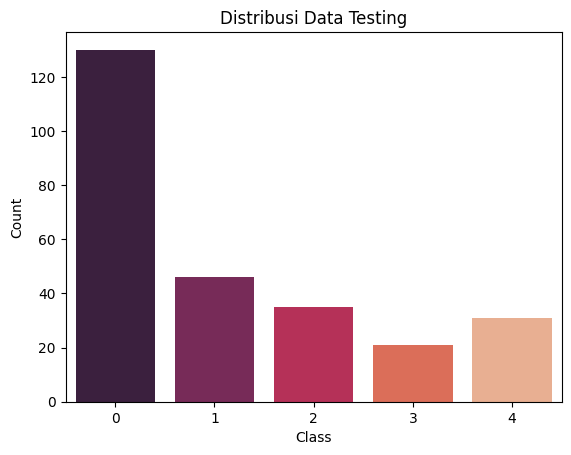

In [ ]:
sns.countplot(x = y_1d, palette = 'rocket')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribusi Data Testing')
plt.show()

### Class Imbalance

#### Random Oversampling

In [ ]:
oversample = RandomOverSampler(sampling_strategy = 'auto')
x_over, y_over = oversample.fit_resample(x_train, encoded_y_train)

NameError: name 'RandomOverSampler' is not defined

In [ ]:
print(y_over)

In [ ]:
len(y_over)

In [ ]:
y_train_1d = np.argmax(y_over, axis = 1)
print(y_train_1d)
print(len(y_train_1d))

In [ ]:
sns.countplot(x = y_train_1d, palette = 'pastel')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribusi Data Oversampling')
plt.show()

#### SMOTE

In [ ]:
oversample = SMOTE(sampling_strategy = 'auto', k_neighbors = 5, random_state = 42)

In [ ]:
x_over, y_over = oversample.fit_resample(x_train, encoded_y_train)

In [ ]:
print(y_over)
print(len(y_over))

[[0 0 0 0 1]
 [1 0 0 0 0]
 [0 0 0 1 0]
 ...
 [0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]]
4580


In [ ]:
y_over_1d = np.argmax(y_over, axis = 1)
print(y_over_1d)
print(len(y_over_1d))

[4 0 3 ... 4 4 4]
4580


/tmp/ipython-input-58-1078456371.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = y_over_1d, palette = 'pastel')


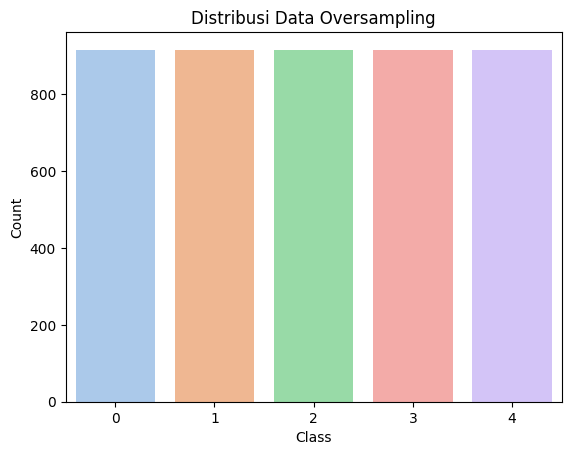

In [ ]:
sns.countplot(x = y_over_1d, palette = 'pastel')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribusi Data Oversampling')
plt.show()

#### Random Undersampling

In [ ]:
undersample = RandomUnderSampler(sampling_strategy = 'auto', random_state = 42)

In [ ]:
x_under, y_under = undersample.fit_resample(x_train, encoded_y_train)

In [ ]:
print(y_under)
print(len(y_under))

In [ ]:
y_under_1d = np.argmax(y_under, axis = 1)
print(y_under_1d)
print(len(y_under_1d))

In [ ]:
sns.countplot(x = y_under_1d, palette = 'pastel')

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribusi Data Undersampling')
plt.show()

#### Normalisasi Resample

In [ ]:
sc = StandardScaler()

In [ ]:
sc.fit(x_over)

StandardScaler()

In [ ]:
x_train_sc = sc.transform(x_over)
print(x_train_sc)

[[ 0.33348671 -0.75803884 -0.244659   ... -1.32909417  0.29534512
  -0.43762518]
 [ 1.52967087  1.27002318  1.27519269 ...  2.13411456  1.47635712
   1.10679714]
 [ 0.64016795 -0.94773781  0.57347199 ... -0.7563145  -1.2650783
   0.25400028]
 ...
 [ 0.63930134 -1.36766342  0.52618111 ... -0.82782659 -0.80681648
  -0.05686267]
 [ 0.07624989 -0.92582559 -0.44331942 ... -1.21164817  0.29529757
  -1.48776336]
 [-0.08720259 -0.46500477 -0.19475154 ... -0.49273191 -0.04736867
  -0.85282351]]


In [ ]:
x_valid_sc = sc.transform(x_valid)
print(x_valid_sc)

[[-0.60802438 -0.56542734 -0.03453329 ... -0.69186796  0.35397036
  -1.14194648]
 [ 1.69076052  1.42486548  1.46984879 ...  2.2361596   1.47635712
   1.10679714]
 [ 1.13534455  1.37572224  1.35207328 ...  1.55776578  1.47635712
   1.10679714]
 ...
 [ 0.34202231 -0.80493488  0.12401221 ... -0.78091624 -1.06701103
  -0.34865368]
 [ 1.26521188  1.34576189  1.24578478 ...  1.76694258  1.47635712
   1.10679714]
 [ 1.2637616   1.99169512  1.09379588 ...  2.4915017   1.47635712
   1.10679714]]


In [ ]:
x_test_sc = sc.transform(x_test)
print(x_test_sc)

[[-0.08720259 -0.46500477 -0.1829714  ... -0.49273191 -0.04422631
  -0.85282351]
 [-0.44625694 -0.75803884 -0.244659   ... -1.07780781  0.29534512
  -0.58651159]
 [-0.08720259 -0.46500477 -0.190808   ... -0.49273191 -0.01699049
  -0.85282351]
 ...
 [-1.81198084  0.72645864 -1.1862894  ...  0.18677019 -0.51237608
   1.01285109]
 [-1.57405346  0.75786001 -1.81032994 ...  0.83964518 -0.51236335
   1.0099513 ]
 [ 0.63935165 -1.36766342  0.52694468 ... -0.81740267 -0.80681648
  -0.05875195]]


### Normalisasi

In [ ]:
sc = StandardScaler()

In [ ]:
sc.fit(select_train)

StandardScaler()

In [ ]:
x_train_sc = sc.transform(select_train)
print(x_train_sc)

[[-0.08444818 -0.86265765]
 [-0.1587924  -0.04449099]
 [ 2.39886417  3.03721392]
 ...
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]]


In [ ]:
x_valid_sc = sc.transform(select_valid)
print(x_valid_sc)

[[ 0.35813955 -0.32635496]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 ...
 [ 2.13421751  1.76419178]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]]


In [ ]:
x_test_sc = sc.transform(select_test)
print(x_test_sc)

[[-0.52210583 -0.77288849]
 [-0.08444818 -0.86265765]
 [-0.53701    -0.82982224]
 [-1.31628392 -0.8621675 ]
 [-0.1587924  -0.04449099]
 [-1.31629664 -0.86216734]
 [-0.08445816 -0.86266531]
 [-1.31629664 -0.86216734]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.08447833 -0.86268071]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.08445816 -0.86266531]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.08444818 -0.86265765]
 [-1.3156734  -0.86218307]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [ 0.53256425 -0.04497526]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [ 2.61213293  4.07771197]
 [-0.1587924  -0.04449099]
 [-0.31875037 -0.7543495 ]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [ 1.3676938   2.02650348]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [-0.1587924  -0.04449099]
 [ 0.3571406  -0.30892986]
 [-1.31629664 -0.86216734]
 [ 0.48433599  0.34359912]
 

## PCA

In [ ]:
pca = PCA(n_components = 40)

pca.fit(x_train_sc)

PCA(n_components=40)

In [ ]:
x_train_pca = pca.transform(x_train_sc)
print(x_train_pca)

[[-119.07051199   27.36488624  -63.04056896 ...    3.62105909
    -1.05614607   -0.5776743 ]
 [  97.38526383    0.31500221   -3.03691004 ...    6.1623451
    -5.93725484   -1.11824194]
 [-126.83050173   49.06355847  -24.58851754 ...   -0.22456985
    -1.94464403    2.03478744]
 ...
 [ 117.11850905    0.79313946    0.92654913 ...   -1.29165092
     1.70161386   -0.66851246]
 [  93.26956887   -1.96063056   -6.61449198 ...    5.34808369
     0.36514185   -1.7300816 ]
 [  91.45808118   -1.54132676   -4.17511943 ...   -0.98455047
     0.41534427   -0.1905218 ]]


In [ ]:
x_valid_pca = pca.transform(x_valid_sc)
print(x_valid_pca)

[[-7.04478044e+01  5.68113845e+01  4.96489022e+01 ... -6.65521769e-03
   2.67231309e-03  3.49500911e-02]
 [ 1.13737129e+02  1.57556720e+00  1.88504290e+00 ...  8.35612767e-01
   3.18358055e+00  5.52057358e+00]
 [ 8.75811679e+01 -1.14346752e+00 -1.00291343e+01 ... -1.11904689e+00
  -4.03162210e+00  1.08069441e-01]
 ...
 [-1.27721066e+02  3.77999440e+01 -4.52199845e+01 ...  1.77310593e-01
   1.33401656e-03  2.26758296e-02]
 [ 7.97849864e+01 -1.86525652e+00 -1.22956054e+01 ...  3.40889091e+00
  -6.39607618e+00 -2.61440393e+00]
 [ 7.33774767e+01 -1.71311113e+00 -1.60916618e+01 ... -7.54191515e-01
  -4.19289362e+00  1.07087546e+00]]


In [ ]:
x_test_pca = pca.transform(x_test_sc)
print(x_test_pca)

[[-1.12744719e+02 -1.54743120e+00 -3.89896634e+01 ... -9.91347823e-02
   6.09985834e-02  1.04620351e-02]
 [-1.22441876e+02  2.55823413e+01 -6.09155750e+01 ... -1.74599967e-01
  -1.54445356e+00 -1.80502563e+00]
 [-1.12815370e+02 -1.59172067e+00 -3.90551403e+01 ...  5.52383564e-02
   2.47029875e-02  4.05397213e-02]
 ...
 [-9.22739991e+01 -8.89230015e+01  2.04935111e+01 ... -5.25162196e+00
   4.28566515e+00 -2.63156739e+00]
 [-9.14021374e+01 -8.71516828e+01  1.95532086e+01 ... -5.63704474e-02
   1.79819861e+00 -2.13336510e-01]
 [-1.14593022e+02  5.08834525e+01 -1.88575801e+01 ...  1.24994121e-02
   1.00001397e-01 -1.18577174e-02]]


## Classifier

In [ ]:
y_train_1d = np.argmax(encoded_y_train, axis = 1)
print(y_train_1d)
print(len(y_train_1d))

[4 0 3 ... 0 0 0]
1852


### SVM

In [ ]:
svm = SVC(
    kernel = 'poly',
    C = 1,
    gamma = 0.01,
    degree = 3,
    coef0 = 1,
    decision_function_shape = 'ovo',
    random_state = 42,
    probability = True)

svm.fit(x_train_pca, y_train_1d)

SVC(C=1, coef0=1, decision_function_shape='ovo', gamma=0.01, kernel='poly',
    probability=True, random_state=42)

In [ ]:
svm.class_weight_

array([1., 1., 1., 1., 1.])

In [ ]:
from joblib import Parallel, delayed
import joblib

#joblib.dump(svm, '/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/svm_rf_30.pkl')

['/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/svm_rf_30.pkl']

In [ ]:
#svm = joblib.load('/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/svm_mrmr_50.pkl')

### KNN

In [ ]:
knn = KNeighborsClassifier(
    algorithm = 'ball_tree',
    n_neighbors = 7,
    p = 1,
    weights = 'uniform')

knn.fit(x_train_pca, y_train_1d)

KNeighborsClassifier(algorithm='ball_tree', n_neighbors=7, p=1)

In [ ]:
from joblib import Parallel, delayed
import joblib

#joblib.dump(knn, '/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/knn_rf_30.pkl')

['/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/knn_rf_30.pkl']

### Random Forest

In [ ]:
rf = RandomForestClassifier(
    criterion = 'gini',
    max_depth = 30,
    max_features = 'sqrt',
    min_samples_leaf = 2,
    min_samples_split = 8,
    n_estimators = 50,
    random_state = 42
)

rf.fit(select_train, y_train_1d)

RandomForestClassifier(max_depth=30, min_samples_leaf=2, min_samples_split=8,
                       n_estimators=50, random_state=42)

In [ ]:
from joblib import Parallel, delayed
import joblib

#joblib.dump(rf, '/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/MRMR_30_MID/rf_30_rf.pkl')

['/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/MRMR_30_MID/rf_30_rf.pkl']

### Naive Bayes

In [ ]:
nb = GaussianNB(var_smoothing = 0.001)

nb.fit(x_train, y_train_1d)

GaussianNB(var_smoothing=0.001)

In [ ]:
from joblib import Parallel, delayed
import joblib

#joblib.dump(nb, '/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/GaussNB_30_rf.pkl')

['/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/random_forest_30/GaussNB_30_rf.pkl']

In [ ]:
#GaussNB = joblib.load('/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/MRMR_50_MIQ/GaussNB_50_mrmr.pkl')

### Decision Tree

In [ ]:
dtree = DecisionTreeClassifier(
    max_depth = 10,
    min_samples_leaf = 3,
    min_samples_split = 2
)

dtree.fit(select_train, y_train_1d)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=3)

### Check Performance

In [ ]:
y_check_train = dtree.predict(select_train)
print("Predicted right: %d" %(y_train_1d == y_check_train).sum())
print("Misclassified samples: %d" %(y_train_1d != y_check_train).sum())

Predicted right: 1847
Misclassified samples: 5


In [ ]:
acc_tr = accuracy_score(y_train_1d, y_check_train)
print("Accuracy score: ", acc_tr)
f1_tr = f1_score(y_train_1d, y_check_train, average = None)
print("F1 score: ", f1_tr)
prec_tr = precision_score(y_train_1d, y_check_train, average = None)
print("Precision score: ", prec_tr)
rec_tr = recall_score(y_train_1d, y_check_train, average = None)
print("Recall: ", rec_tr)

Accuracy score:  0.9973002159827213
F1 score:  [1.         0.99378882 0.9979716  0.99676375 0.99061033]
Precision score:  [1.         0.99378882 0.99595142 1.         0.99061033]
Recall:  [1.         0.99378882 1.         0.99354839 0.99061033]


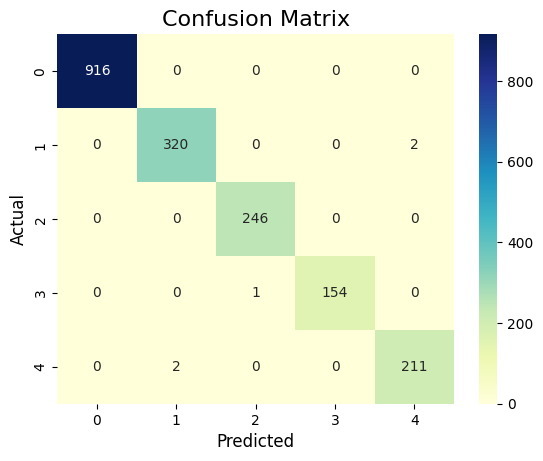

In [ ]:
cm = confusion_matrix(y_train_1d, y_check_train)

sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'YlGnBu')
plt.xlabel('Predicted', fontsize = 12)
plt.ylabel('Actual', fontsize = 12)
plt.title('Confusion Matrix', fontsize = 16)
plt.show()

In [ ]:
y_tr_scores = dtree.predict_proba(select_train)
y_tr_scores

array([[0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       ...,
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [ ]:
macro_roc_auc_ovo = roc_auc_score(
    y_train_1d,
    y_tr_scores,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score: {macro_roc_auc_ovo}")

Macro-averaged One-vs-One ROC AUC score: 0.9999488316344893


In [ ]:
y_pred = dtree.predict(select_valid)

In [ ]:
y_valid_1d = np.argmax(encoded_y_valid, axis = 1)
print(y_valid_1d)

[2 0 0 0 0 0 4 1 2 0 1 0 0 0 0 2 1 0 0 0 2 0 0 0 0 0 0 4 1 1 2 1 0 1 2 0 0
 0 1 1 0 1 4 0 0 1 0 3 1 4 1 4 0 2 1 2 3 0 3 1 2 0 0 4 0 0 0 0 1 0 0 4 0 0
 0 4 2 2 0 2 0 0 1 0 1 2 4 2 0 0 0 0 0 0 4 3 0 0 0 0 0 0 4 3 0 3 4 0 2 2 0
 0 2 0 0 0 0 4 0 3 0 0 0 1 0 0 1 3 1 2 4 4 4 0 2 2 0 0 4 1 0 3 0 0 3 0 0 1
 0 0 1 4 0 3 1 4 3 0 0 0 0 3 1 4 0 2 0 2 4 1 0 4 4 1 4 0 0 0 1 3 1 0 3 0 1
 4 0 0 1 4 1 2 3 0 0 0 0 0 1 0 1 0 0 1 0 1 2 1 1 1 4 0 1 4 3 0 2 0 0 1 0 2
 2 0 0 2 1 3 0 1 1 0 2 0 0 0 4 4 2 0 0 0 1 0 1 4 1 0 4 2 3 1 0 1 0 0 0 0 0
 2 0 4 4 4 2 4 0 3 0 0 1 3 1 1 2 0 0 3 0 0 0 0 0 1 0 4 0 0 0 3 0 1 0 0 2 0
 1 0 3 1 2 2 0 3 3 1 2 3 0 4 3 0 0 4 4 2 0 0 1 1 2 0 4 0 0 0 2 1 1 0 3 0 0
 2 2 2 0 1 0 1 0 4 0 0 0 4 2 1 0 0 1 0 2 0 0 0 3 4 1 1 1 0 0 1 3 3 0 0 0 0
 0 4 3 4 0 0 0 0 4 0 1 0 0 2 0 0 1 0 0 0 3 0 3 2 1 0 4 0 0 0 2 0 0 0 1 0 2
 0 0 1 4 2 0 2 0 0 0 0 0 3 4 0 0 0 1 0 0 4 1 1 0 3 0 3 2 2 3 2 1 0 2 0 0 4
 1 1 1 0 2 2 0 1 2 2 3 0 2 4 0 4 3 4 0 0 0 0 0 2 0 0 0 1 0 0 1 1 1 0 0 0 4
 0 0 2 4 1 0 0 2 2 0 0 2 

In [ ]:
print("Predicted right: %d" %(y_valid_1d == y_pred).sum())
print("Misclassified samples: %d" %(y_valid_1d != y_pred).sum())

Predicted right: 521
Misclassified samples: 2


In [ ]:
accuracy = accuracy_score(y_valid_1d, y_pred)
print("Accuracy score: ", accuracy)
f1_class = f1_score(y_valid_1d, y_pred, average = None)
print("F1 score: ", f1_class)
prec = precision_score(y_valid_1d, y_pred, average = None)
print("Precision: ", prec)
rec = recall_score(y_valid_1d, y_pred, average = None)
print("Recall: ", rec)

Accuracy score:  0.9961759082217974
F1 score:  [1.         0.99453552 0.99280576 0.98850575 0.99159664]
Precision:  [1.         0.98913043 0.98571429 1.         1.        ]
Recall:  [1.         1.         1.         0.97727273 0.98333333]


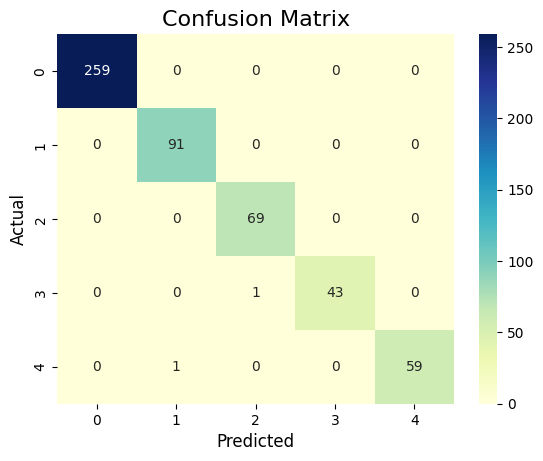

In [ ]:
cm = confusion_matrix(y_valid_1d, y_pred)

sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'YlGnBu')
plt.xlabel('Predicted', fontsize = 12)
plt.ylabel('Actual', fontsize = 12)
plt.title('Confusion Matrix', fontsize = 16)
plt.show()

In [ ]:
y_scores = dtree.predict_proba(select_valid)
y_scores

array([[0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [ ]:
def plot_roc_curve_revise(label_a, label_b):
    # Mask samples for only classes a and b
    ab_mask = np.logical_or(y_valid_1d == label_a, y_valid_1d == label_b)
    y_ab = y_valid_1d[ab_mask]
    y_a_bin = (y_ab == label_a).astype(int)  # Label A is positive class (1), B is negative (0)
    y_b_bin = (y_ab == label_b).astype(int)  # Label B is positive class(1), A is negative (0)

    # Use the model's predicted probability for label_a
    idx_a = np.where(nb.classes_ == label_a)[0][0]
    idx_b = np.where(nb.classes_ == label_b)[0][0]

    prob_a = y_scores[ab_mask, idx_a]
    prob_b = y_scores[ab_mask, idx_b]

    # Calculate AUC
    auc_a = roc_auc_score(y_a_bin, prob_a)
    auc_b = roc_auc_score(y_b_bin, prob_b)

    # Plot
    fig, ax = plt.subplots(figsize=(6, 6))
    RocCurveDisplay.from_predictions(
        y_a_bin, prob_a,
        ax=ax,
        name=f"{label_a} as positive (AUC = {auc_a:.4f})",
        linestyle='-',
        linewidth=2,
        alpha=0.8,
    )
    RocCurveDisplay.from_predictions(
        y_b_bin, prob_b,
        ax = ax,
        name = f"{label_b} as positive (AUC = {auc_b:.4f})",
        linestyle = '--',
        linewidth = 2,
        alpha = 0.8,
        plot_chance_level = True
    )

    ax.set_title(f"ROC Curve: {label_a} vs {label_b}")
    ax.grid(True, alpha = 0.3)
    plt.tight_layout()
    plt.show()


In [ ]:
plot_roc_curve_revise(3, 4)

NameError: name 'plot_roc_curve_revise' is not defined

In [ ]:
macro_roc_auc_ovo = roc_auc_score(
    y_valid_1d,
    y_scores,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score: {macro_roc_auc_ovo}")

Macro-averaged One-vs-One ROC AUC score: 0.999904805339588


### Check Performance di Data Testing

In [ ]:
y_pred_test = dtree.predict(select_test)

In [ ]:
y_test_1d = np.argmax(encoded_y_test, axis = 1)
print(y_test_1d)

[4 4 4 1 0 1 4 1 0 0 0 4 0 0 4 0 0 4 1 0 0 2 0 0 0 3 0 1 0 0 4 0 0 0 2 1 4
 0 2 3 0 1 2 1 2 0 2 3 0 0 0 0 2 1 0 4 0 0 0 4 0 4 4 0 1 0 1 0 1 2 1 0 2 0
 1 0 1 0 3 3 1 0 2 2 0 0 2 0 3 4 2 0 2 0 0 4 0 0 0 1 0 1 4 2 0 0 0 2 0 1 2
 0 3 4 0 0 4 2 1 1 1 3 0 0 3 0 1 2 0 1 0 1 0 0 3 0 0 2 3 0 0 0 0 0 0 0 1 0
 1 0 0 4 3 1 0 0 0 2 0 0 0 2 0 4 0 1 0 1 2 1 0 3 4 0 0 0 3 0 0 2 2 1 0 0 0
 0 0 0 4 1 1 4 0 1 0 1 0 3 1 0 0 3 0 0 1 2 3 0 3 0 0 1 2 0 1 3 0 0 0 0 0 0
 1 0 0 0 2 0 2 0 2 1 1 4 2 0 0 4 4 0 0 0 2 2 3 4 0 2 0 0 0 0 0 4 1 0 4 2 3
 4 1 1 4]


In [ ]:
print("Predicted right: %d" %(y_test_1d == y_pred_test).sum())
print("Misclassified samples: %d" %(y_test_1d != y_pred_test).sum())

Predicted right: 261
Misclassified samples: 2


In [ ]:
accuracy_test = accuracy_score(y_test_1d, y_pred_test)
print("Accuracy score: ", accuracy_test)
f1_class_test = f1_score(y_test_1d, y_pred_test, average = None)
print("F1 score: ", f1_class_test)
prec_test = precision_score(y_test_1d, y_pred_test, average = None)
print("Precision: ", prec_test)
rec_test = recall_score(y_test_1d, y_pred_test, average = None)
print("Recall: ", rec_test)

Accuracy score:  0.9923954372623575
F1 score:  [1.         0.98924731 1.         0.97560976 0.96774194]
Precision:  [1.         0.9787234  1.         1.         0.96774194]
Recall:  [1.         1.         1.         0.95238095 0.96774194]


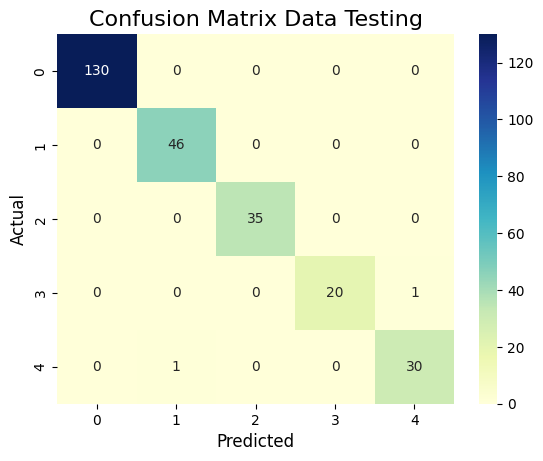

In [ ]:
cm_test = confusion_matrix(y_test_1d, y_pred_test)

sns.heatmap(cm_test, annot = True, fmt = 'd', cmap = 'YlGnBu')
plt.xlabel('Predicted', fontsize = 12)
plt.ylabel('Actual', fontsize = 12)
plt.title('Confusion Matrix Data Testing', fontsize = 16)
plt.show()

In [ ]:
y_scores_test = dtree.predict_proba(select_test)
y_scores_test

array([[0. , 0. , 0. , 0. , 1. ],
       [0. , 0. , 0. , 0. , 1. ],
       [0. , 0.9, 0. , 0. , 0.1],
       ...,
       [0. , 1. , 0. , 0. , 0. ],
       [0. , 1. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 1. ]])

In [ ]:
def plot_roc_curve_test(label_a, label_b):
    # Mask samples for only classes a and b
    ab_mask = np.logical_or(y_test_1d == label_a, y_test_1d == label_b)
    y_ab = y_test_1d[ab_mask]
    y_a_bin = (y_ab == label_a).astype(int)  # Label A is positive class (1), B is negative (0)
    y_b_bin = (y_ab == label_b).astype(int)  # Label B is positive class(1), A is negative (0)

    # Use the model's predicted probability for label_a
    idx_a = np.where(nb.classes_ == label_a)[0][0]
    idx_b = np.where(nb.classes_ == label_b)[0][0]

    prob_a = y_scores_test[ab_mask, idx_a]
    prob_b = y_scores_test[ab_mask, idx_b]

    # Calculate AUC
    auc_a = roc_auc_score(y_a_bin, prob_a)
    auc_b = roc_auc_score(y_b_bin, prob_b)

    # Plot
    fig, ax = plt.subplots(figsize=(6, 6))
    RocCurveDisplay.from_predictions(
        y_a_bin, prob_a,
        ax=ax,
        name=f"{label_a} as positive (AUC = {auc_a:.4f})",
        linestyle='-',
        linewidth=2,
        alpha=0.8,
    )
    RocCurveDisplay.from_predictions(
        y_b_bin, prob_b,
        ax = ax,
        name = f"{label_b} as positive (AUC = {auc_b:.4f})",
        linestyle = '--',
        linewidth = 2,
        alpha = 0.8,
        plot_chance_level = True
    )

    ax.set_title(f"ROC Curve: {label_a} vs {label_b}")
    ax.grid(True, alpha = 0.3)
    plt.tight_layout()
    plt.show()


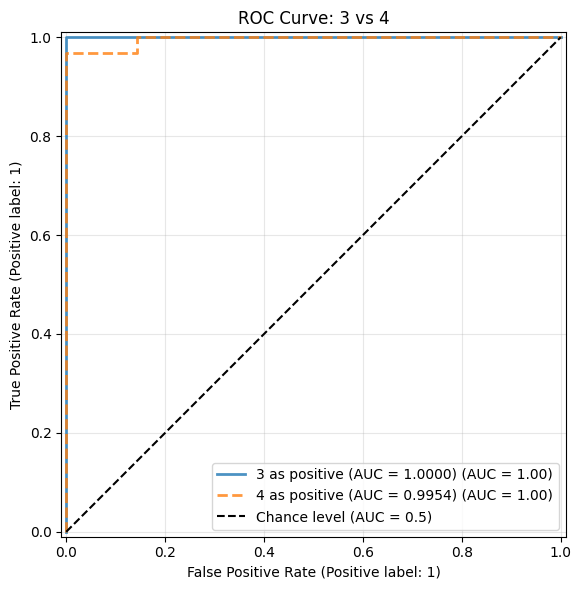

In [ ]:
plot_roc_curve_test(3, 4)

In [ ]:
macro_roc_auc_test = roc_auc_score(
    y_test_1d,
    y_scores_test,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score: {macro_roc_auc_test}")

Macro-averaged One-vs-One ROC AUC score: 0.9938282718416961


## Stratified K Fold Cross Validation

In [ ]:
skf = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)
acc_skf = []
prec_skf = []
f1_skf = []
rec_skf = []
auc_skf = []

In [ ]:
## Pipeline Bukan Pake Resampling

from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(
        algorithm = 'ball_tree',
    n_neighbors = 7,
    p = 1,
    weights = 'uniform'
    ))
])

In [ ]:

from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('dtree', DecisionTreeClassifier(
    max_depth = 10,
    min_samples_leaf = 3,
    min_samples_split = 2
    ))
])


In [ ]:
'''
## Pipeline buat pake PCA
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components = 3)),
    ('nb', GaussianNB(var_smoothing = 0.001))
])
'''

In [ ]:
## Resampling
#oversampling = RandomOverSampler(sampling_strategy = 'auto', random_state = 42)
oversampling = SMOTE(sampling_strategy = 'auto', k_neighbors = 5, random_state = 42)
#undersampling = RandomUnderSampler(sampling_strategy = 'auto', random_state = 42)

In [ ]:
## Pipeline Buat Pake Resampling
from imblearn.pipeline import Pipeline

steps = [('over', oversampling),
         ('scaler', StandardScaler()),
         ('pca', PCA(n_components = 3)),
         ('model', GaussianNB(var_smoothing = 0.001))]

pipeline = Pipeline(steps = steps)

NameError: name 'oversampling' is not defined

In [ ]:
y_train_1d = np.argmax(encoded_y_train, axis = 1)
print(y_train_1d)
print(len(y_train_1d))

[4 0 3 ... 0 0 0]
1852


In [ ]:
for train_idx, valid_idx in skf.split(select_train, y_train_1d):
  x_train_skf, x_valid_skf = x_train.iloc[train_idx], x_train.iloc[valid_idx]
  y_train_skf, y_valid_skf = y_train_1d[train_idx], y_train_1d[valid_idx]

  pipeline.fit(x_train_skf, y_train_skf)

  y_pred = pipeline.predict(x_valid_skf)

  acc = accuracy_score(y_valid_skf, y_pred)
  acc_skf.append(acc)
  print("Accuracy: ", acc)

  f1 = f1_score(y_valid_skf, y_pred, average = None)
  f1_skf.append(f1)

  prec = precision_score(y_valid_skf, y_pred, average = None)
  prec_skf.append(prec)

  rec = recall_score(y_valid_skf, y_pred, average = None)
  rec_skf.append(rec)

  y_score = pipeline.predict_proba(x_valid_skf)
  macro_auc = roc_auc_score(y_valid_skf, y_score, multi_class="ovo", average="macro")
  auc_skf.append(macro_auc)


Accuracy:  1.0
Accuracy:  1.0
Accuracy:  1.0
Accuracy:  1.0
Accuracy:  1.0
Accuracy:  1.0
Accuracy:  1.0
Accuracy:  0.9837837837837838
Accuracy:  1.0
Accuracy:  0.9945945945945946


In [ ]:
print("Average accuracy: %.4f" %mean(acc_skf))
print("Std accuracy: %.4f" %stdev(acc_skf))

Average accuracy: 0.9978
Std accuracy: 0.0052


In [ ]:
df_f1 = pd.DataFrame(f1_skf)
f1_mean = df_f1.mean()
f1_mean = f1_mean.to_list()
print("Average of F1 score for each class: ", f1_mean)

f1_std = df_f1.std()
f1_std = f1_std.to_list()
print("Std of F1 score for each class: ", f1_std)

Average of F1 score for each class:  [1.0, 0.9984126984126984, 1.0, 0.987292277614858, 0.9926829268292682]
Std of F1 score for each class:  [0.0, 0.005019488349473635, 0.0, 0.031035205994892564, 0.023138617025622275]


In [ ]:
df_prec = pd.DataFrame(prec_skf)

prec_mean = df_prec.mean()
prec_mean = prec_mean.to_list()
print("Average of precision for each class: ", prec_mean)

prec_std = df_prec.std()
prec_std = prec_std.to_list()
print("Std of precision for each class: ", prec_std)

Average of precision for each class:  [1.0, 1.0, 1.0, 0.9816176470588236, 0.9949999999999999]
Std of precision for each class:  [0.0, 0.0, 0.0, 0.041774658208478706, 0.01581138830084191]


In [ ]:
df_rec = pd.DataFrame(rec_skf)

rec_mean = df_rec.mean()
rec_mean = rec_mean.to_list()
print("Average of recall for each class: ", rec_mean)

rec_std = df_rec.std()
rec_std = rec_std.to_list()
print("Std of recall for each class: ", rec_std)

Average of recall for each class:  [1.0, 0.996875, 1.0, 0.9933333333333334, 0.9904761904761905]
Std of recall for each class:  [0.0, 0.009882117688026186, 0.0, 0.02108185106778919, 0.03011693009684171]


In [ ]:
print("Average AUC: %f" %mean(auc_skf))
print("Std AUC: %f" %stdev(auc_skf))

Average AUC: 0.997586
Std AUC: 0.006382


## PCA Plot

In [ ]:
pc = PCA(n_components = 2)

In [ ]:
pc.fit(x_train_sc)

PCA(n_components=2)

In [ ]:
train_pca = pc.transform(x_train_sc)

In [ ]:
valid_pca = pc.transform(x_valid_sc)

In [ ]:
test_pca = pc.transform(x_test_sc)

In [ ]:
explained_variance = pc.explained_variance_ratio_
print(explained_variance)

[0.60286094 0.12278329]


In [ ]:
classifier = RandomForestClassifier(
    criterion = 'gini',
    max_depth = 30,
    max_features = 'sqrt',
    min_samples_leaf = 2,
    min_samples_split = 8,
    n_estimators = 50,
    random_state = 42
)

In [ ]:
classifier.fit(x_train_sc, y_train_1d)

RandomForestClassifier(max_depth=30, min_samples_leaf=2, min_samples_split=8,
                       n_estimators=50, random_state=42)

In [ ]:
y_train_1d = np.argmax(encoded_y_train, axis = 1)
print(y_train_1d)
print(len(y_train_1d))

[4 0 3 ... 0 0 0]
1852


In [ ]:
classifier.fit(train_pca, y_train_1d)

KNeighborsClassifier(algorithm='ball_tree', n_neighbors=7, p=1)

In [ ]:
#classifier.class_weight_

In [ ]:
y_pred_pca = classifier.predict(valid_pca)

In [ ]:
y_valid_1d = np.argmax(encoded_y_valid, axis = 1)
print(y_valid_1d)

[2 0 0 0 0 0 4 1 2 0 1 0 0 0 0 2 1 0 0 0 2 0 0 0 0 0 0 4 1 1 2 1 0 1 2 0 0
 0 1 1 0 1 4 0 0 1 0 3 1 4 1 4 0 2 1 2 3 0 3 1 2 0 0 4 0 0 0 0 1 0 0 4 0 0
 0 4 2 2 0 2 0 0 1 0 1 2 4 2 0 0 0 0 0 0 4 3 0 0 0 0 0 0 4 3 0 3 4 0 2 2 0
 0 2 0 0 0 0 4 0 3 0 0 0 1 0 0 1 3 1 2 4 4 4 0 2 2 0 0 4 1 0 3 0 0 3 0 0 1
 0 0 1 4 0 3 1 4 3 0 0 0 0 3 1 4 0 2 0 2 4 1 0 4 4 1 4 0 0 0 1 3 1 0 3 0 1
 4 0 0 1 4 1 2 3 0 0 0 0 0 1 0 1 0 0 1 0 1 2 1 1 1 4 0 1 4 3 0 2 0 0 1 0 2
 2 0 0 2 1 3 0 1 1 0 2 0 0 0 4 4 2 0 0 0 1 0 1 4 1 0 4 2 3 1 0 1 0 0 0 0 0
 2 0 4 4 4 2 4 0 3 0 0 1 3 1 1 2 0 0 3 0 0 0 0 0 1 0 4 0 0 0 3 0 1 0 0 2 0
 1 0 3 1 2 2 0 3 3 1 2 3 0 4 3 0 0 4 4 2 0 0 1 1 2 0 4 0 0 0 2 1 1 0 3 0 0
 2 2 2 0 1 0 1 0 4 0 0 0 4 2 1 0 0 1 0 2 0 0 0 3 4 1 1 1 0 0 1 3 3 0 0 0 0
 0 4 3 4 0 0 0 0 4 0 1 0 0 2 0 0 1 0 0 0 3 0 3 2 1 0 4 0 0 0 2 0 0 0 1 0 2
 0 0 1 4 2 0 2 0 0 0 0 0 3 4 0 0 0 1 0 0 4 1 1 0 3 0 3 2 2 3 2 1 0 2 0 0 4
 1 1 1 0 2 2 0 1 2 2 3 0 2 4 0 4 3 4 0 0 0 0 0 2 0 0 0 1 0 0 1 1 1 0 0 0 4
 0 0 2 4 1 0 0 2 2 0 0 2 

In [ ]:
print("Predicted right: %d" %(y_valid_1d == y_pred_pca).sum())
print("Misclassified samples: %d" %(y_valid_1d != y_pred_pca).sum())

Predicted right: 522
Misclassified samples: 1


In [ ]:
y_pred_test_pca = classifier.predict(test_pca)

In [ ]:
y_test_1d = np.argmax(encoded_y_test, axis = 1)
print(y_test_1d)

[4 4 4 1 0 1 4 1 0 0 0 4 0 0 4 0 0 4 1 0 0 2 0 0 0 3 0 1 0 0 4 0 0 0 2 1 4
 0 2 3 0 1 2 1 2 0 2 3 0 0 0 0 2 1 0 4 0 0 0 4 0 4 4 0 1 0 1 0 1 2 1 0 2 0
 1 0 1 0 3 3 1 0 2 2 0 0 2 0 3 4 2 0 2 0 0 4 0 0 0 1 0 1 4 2 0 0 0 2 0 1 2
 0 3 4 0 0 4 2 1 1 1 3 0 0 3 0 1 2 0 1 0 1 0 0 3 0 0 2 3 0 0 0 0 0 0 0 1 0
 1 0 0 4 3 1 0 0 0 2 0 0 0 2 0 4 0 1 0 1 2 1 0 3 4 0 0 0 3 0 0 2 2 1 0 0 0
 0 0 0 4 1 1 4 0 1 0 1 0 3 1 0 0 3 0 0 1 2 3 0 3 0 0 1 2 0 1 3 0 0 0 0 0 0
 1 0 0 0 2 0 2 0 2 1 1 4 2 0 0 4 4 0 0 0 2 2 3 4 0 2 0 0 0 0 0 4 1 0 4 2 3
 4 1 1 4]


PCA Data Training

In [ ]:
plot_decision_regions(x_train_sc, y_train_1d, clf = dtree, legend = 2)
plt.title('Decision Region Data Training')
plt.xlabel('C21orf2')
plt.ylabel('SSSCA1')
plt.legend(loc = 'lower left')
plt.show()

NameError: name 'x_train_sc' is not defined

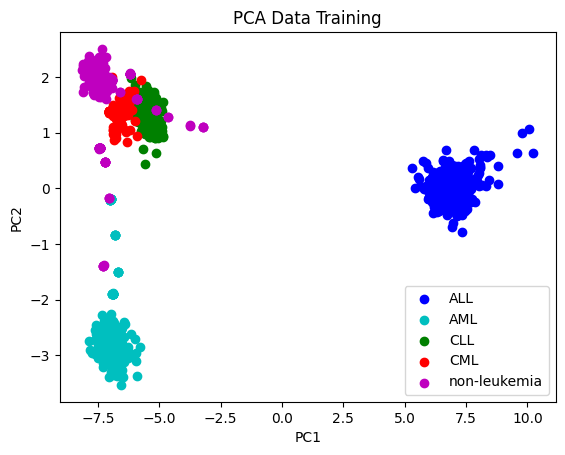

In [ ]:
colors = ["b", "c", "g", "r", "m"]
labels = ["ALL", "AML", "CLL", "CML", "non-leukemia"]

for i, color, label in zip(np.unique(y_train), colors, labels):
  plt.scatter(train_pca[y_train == i, 0],
              train_pca[y_train == i, 1],
              color = color,
              label = label)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Data Training")
plt.legend()
plt.show()

Data Validation

/usr/local/lib/python3.11/dist-packages/mlxtend/plotting/decision_regions.py:346: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


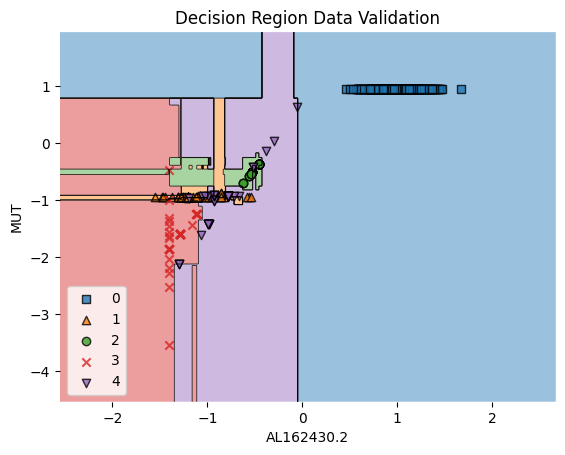

In [ ]:
plot_decision_regions(x_valid_sc, y_valid_1d, clf = classifier, legend = 2)
plt.title("Decision Region Data Validation")
plt.xlabel('AL162430.2')
plt.ylabel('MUT')
plt.legend(loc = 'lower left')
plt.show()

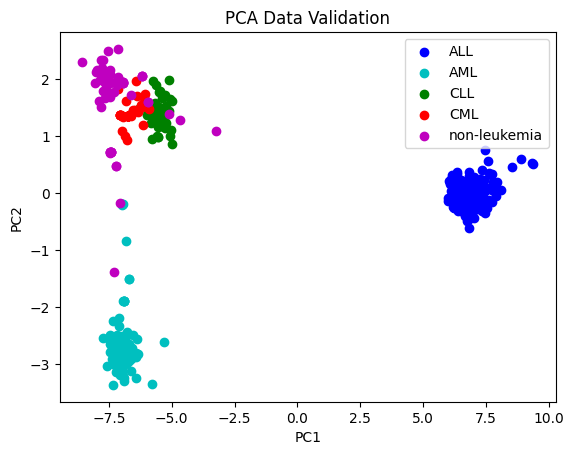

In [ ]:
colors = ["b", "c", "g", "r", "m"]
labels = ["ALL", "AML", "CLL", "CML", "non-leukemia"]

for i, color, label in zip(np.unique(y_valid), colors, labels):
  plt.scatter(valid_pca[y_valid == i, 0],
              valid_pca[y_valid == i, 1],
              color = color,
              label = label)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Data Validation")
plt.legend()
plt.show()

PCA data testing

/usr/local/lib/python3.11/dist-packages/mlxtend/plotting/decision_regions.py:346: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


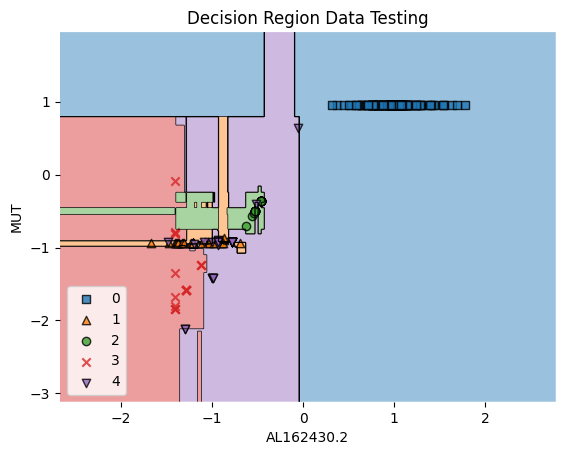

In [ ]:
plot_decision_regions(x_test_sc, y_test_1d, clf = classifier, legend = 2)
plt.title("Decision Region Data Testing")
plt.xlabel('AL162430.2')
plt.ylabel('MUT')
plt.legend(loc = 'lower left')
plt.show()

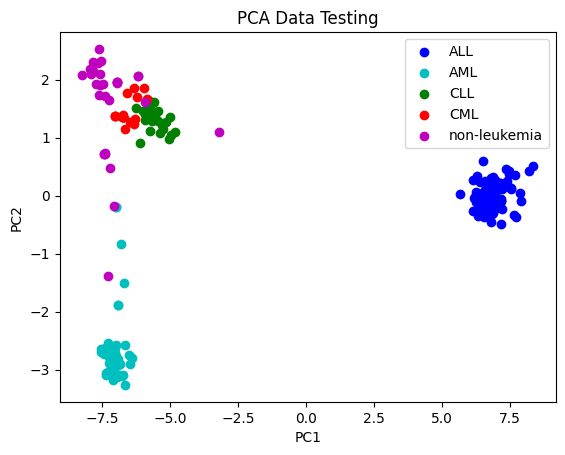

In [ ]:
colors = ["b", "c", "g", "r", "m"]
labels = ["ALL", "AML", "CLL", "CML", "non-leukemia"]

for i, color, label in zip(np.unique(y_test), colors, labels):
  plt.scatter(test_pca[y_test == i, 0],
              test_pca[y_test == i, 1],
              color = color,
              label = label)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Data Testing")
plt.legend()
plt.show()

##Plot

In [ ]:
x_combined_std = np.vstack((x_train_sc, x_valid_sc, x_test_sc))
y_combined_std = np.hstack((y_train_1d, y_valid_1d, y_test_1d))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mlxtend/plotting/decision_regions.py:346: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


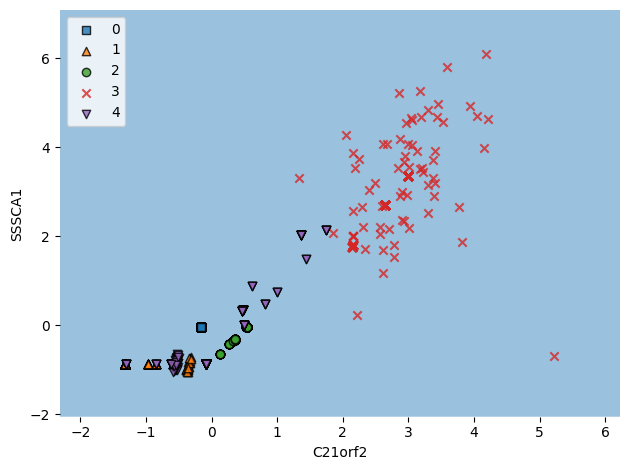

In [ ]:
plot_decision_regions(X=x_combined_std, y=y_combined_std, clf=dtree, legend=2)
plt.xlabel('C21orf2')
plt.ylabel('SSSCA1')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

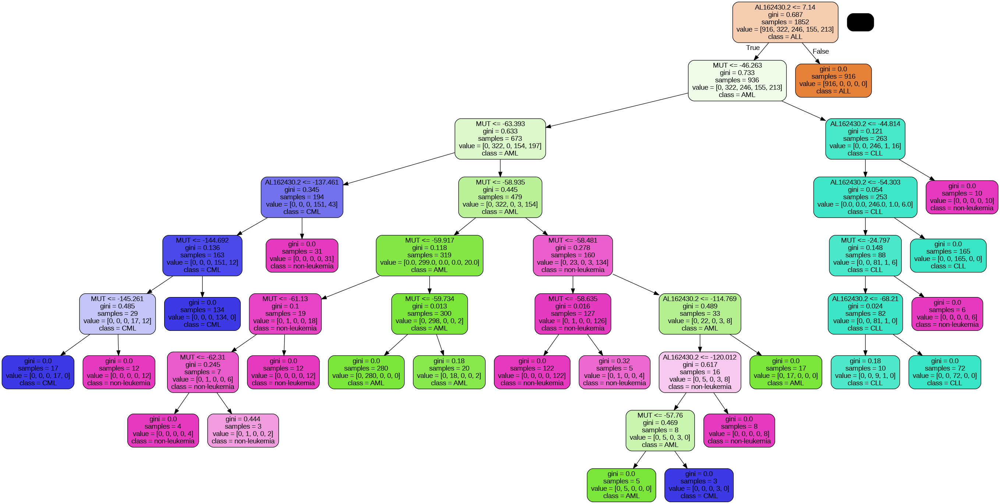

In [ ]:
import pydotplus
from sklearn.tree import export_graphviz
from IPython.display import Image
from IPython.display import display

dot_data = export_graphviz(
            dtree, out_file= None,
            feature_names=['AL162430.2', 'MUT'],
            #class_names=['A atau AB', 'B atau BC', 'C atau D', 'E atau T'],
            class_names=['ALL', 'AML', 'CLL', 'CML', 'non-leukemia'],
            filled = True,
            rounded = True)

graph = pydotplus.graph_from_dot_data(dot_data)
display(Image(graph.create_png()))

In [ ]:
x_min, x_max = select_train.iloc[:, 0].min() - 1, select_train.iloc[:, 0].max() + 1
y_min, y_max = select_train.iloc[:, 1].min() - 1, select_train.iloc[:, 1].max() + 1

In [ ]:
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

In [ ]:
grid = np.c_[xx.ravel(), yy.ravel()]
Z = rf.predict(grid)  # Random Forest predictions
Z = Z.reshape(xx.shape)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')  # the decision boundary
plt.scatter(select_train[:, 0], select_train[:, 1], c=y_train_1d, edgecolor='k', cmap='coolwarm')  # actual data
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("Random Forest Decision Boundary")
plt.show()

In [ ]:
h = 0.01  # mesh step size
x_min, x_max = select_train[:, 0].min() - 1, select_train[:, 0].max() + 1
y_min, y_max = select_train[:, 1].min() - 1, select_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

Z = rf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.3)  # draw boundary
plt.scatter(select_train[:, 0], select_train[:, 1], c=y_1d, edgecolors='k')  # plot points
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary')
plt.show()

InvalidIndexError: (slice(None, None, None), 0)

## GridSearchCV

In [ ]:
y_train_1d = np.argmax(encoded_y_train, axis = 1)
print(y_train_1d)
print(len(y_train_1d))

[4 0 3 ... 0 0 0]
1852


In [ ]:
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('dtree', DecisionTreeClassifier(random_state = 42))
])

In [ ]:
'''
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('GaussNB', GaussianNB())
])'''

In [ ]:
param_grid = {'dtree__max_depth': [10, 20, 30, 40, 50],
              'dtree__min_samples_split': [2, 4, 6, 8],
              'dtree__min_samples_leaf': [2, 3, 4, 5, 6]}

In [ ]:
#param_grid = {'lr__solver': ['lbfgs', 'newton-cg', 'newton-cholesky', 'sag'],
 #             'lr__C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]}

In [ ]:
#param_grid = {'GaussNB__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 1e2, 1e3, 1e4, 1e5, 1e6, 1e7, 1e8, 1e9]}

In [ ]:
#param_grid = {'rf__max_features': ['sqrt', 'log2', 'None'],
 #             'rf__n_estimators': [50, 100, 150, 200, 250, 300],
  #            'rf__max_depth': [30, 50, 70, 90, 100],
   #           'rf__min_samples_split': [4, 6, 8],
    #          'rf__min_samples_leaf': [2, 3, 4, 5]}

In [ ]:
#param_grid = {'knn__n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31],
 #             'knn__p': [1, 2]}

In [ ]:
#param_grid = {'svm__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
 #             'svm__gamma': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
  #            'svm__coef0': [-3, -2, -1, 0, 1, 2, 3],
   #           'svm__decision_function_shape': ['ovo', 'ovr']
    #          }

In [ ]:
grid = GridSearchCV(pipeline, param_grid, refit = True, verbose = 3, cv = 10, return_train_score = True)

In [ ]:
select_train

Unnamed: 0,C21orf2,SSSCA1
GSM7461809,1.080823,-39.410651
MP2PRT_ALL_482,-3.320968,-4.484265
GSE277354_67,148.113386,127.06939
MP2PRT_ALL_1066,-3.320968,-4.484265
MP2PRT_ALL_613,-3.320968,-4.484265
...,...,...
MP2PRT_ALL_232,-3.320968,-4.484265
GSM8013463,-71.854832,-39.389718
MP2PRT_ALL_989,-3.320968,-4.484265
MP2PRT_ALL_339,-3.320968,-4.484265


In [ ]:
grid.fit(select_train, y_train_1d)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV 1/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=0.989) total time=   0.0s
[CV 2/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=1.000) total time=   0.0s
[CV 3/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=1.000) total time=   0.0s
[CV 4/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=0.995) total time=   0.0s
[CV 5/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=1.000) total time=   0.0s
[CV 6/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_split=2;, score=(train=0.999, test=0.995) total time=   0.0s
[CV 7/10] END dtree__max_depth=10, dtree__min_samples_leaf=2, dtree__min_samples_sp

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('dtree',
                                        DecisionTreeClassifier(random_state=42))]),
             param_grid={'dtree__max_depth': [10, 20, 30, 40, 50],
                         'dtree__min_samples_leaf': [2, 3, 4, 5, 6],
                         'dtree__min_samples_split': [2, 4, 6, 8]},
             return_train_score=True, verbose=3)

In [ ]:
print("Best parameter: ", grid.best_params_)

Best parameter:  {'dtree__max_depth': 10, 'dtree__min_samples_leaf': 3, 'dtree__min_samples_split': 2}


In [ ]:
print("Best estimator: ", grid.best_estimator_)

Best estimator:  Pipeline(steps=[('scaler', StandardScaler()),
                ('dtree',
                 DecisionTreeClassifier(max_depth=10, min_samples_leaf=3,
                                        random_state=42))])


In [ ]:
res = grid.cv_results_
data_res = pd.DataFrame.from_dict(res)
data_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_dtree__max_depth,param_dtree__min_samples_leaf,param_dtree__min_samples_split,params,split0_test_score,split1_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.005229,0.000565,0.001921,0.000199,10,2,2,"{'dtree__max_depth': 10, 'dtree__min_samples_l...",0.989247,1.0,...,0.9988,0.9988,0.9988,0.9988,0.9988,0.9988,1.0,0.9988,0.99892,0.00036
1,0.004918,0.000122,0.001852,0.000043,10,2,4,"{'dtree__max_depth': 10, 'dtree__min_samples_l...",0.989247,1.0,...,0.9988,0.9988,0.9988,0.9988,0.9988,0.9988,1.0,0.9988,0.99892,0.00036
2,0.005467,0.000958,0.001932,0.000054,10,2,6,"{'dtree__max_depth': 10, 'dtree__min_samples_l...",0.989247,1.0,...,0.9988,0.9988,0.9988,0.9988,0.9988,0.9988,1.0,0.9988,0.99892,0.00036
3,0.006017,0.001385,0.002248,0.000456,10,2,8,"{'dtree__max_depth': 10, 'dtree__min_samples_l...",0.989247,1.0,...,0.9988,0.9988,0.9988,0.9988,0.9988,0.9988,1.0,0.9988,0.99892,0.00036
4,0.004861,0.000347,0.001831,0.000074,10,3,2,"{'dtree__max_depth': 10, 'dtree__min_samples_l...",1.000000,1.0,...,0.9988,0.9988,0.9988,0.9988,0.9988,0.9988,1.0,0.9988,0.99892,0.00036


In [ ]:
#data_res.to_csv('/content/drive/MyDrive/Tugas Akhir/machine_learning_revisi/gridsearch_decisiontree.tsv', sep = "\t")

In [ ]:
y_valid_1d = np.argmax(encoded_y_valid, axis = 1)
y_valid_1d

array([2, 0, 0, 0, 0, 0, 4, 1, 2, 0, 1, 0, 0, 0, 0, 2, 1, 0, 0, 0, 2, 0,
       0, 0, 0, 0, 0, 4, 1, 1, 2, 1, 0, 1, 2, 0, 0, 0, 1, 1, 0, 1, 4, 0,
       0, 1, 0, 3, 1, 4, 1, 4, 0, 2, 1, 2, 3, 0, 3, 1, 2, 0, 0, 4, 0, 0,
       0, 0, 1, 0, 0, 4, 0, 0, 0, 4, 2, 2, 0, 2, 0, 0, 1, 0, 1, 2, 4, 2,
       0, 0, 0, 0, 0, 0, 4, 3, 0, 0, 0, 0, 0, 0, 4, 3, 0, 3, 4, 0, 2, 2,
       0, 0, 2, 0, 0, 0, 0, 4, 0, 3, 0, 0, 0, 1, 0, 0, 1, 3, 1, 2, 4, 4,
       4, 0, 2, 2, 0, 0, 4, 1, 0, 3, 0, 0, 3, 0, 0, 1, 0, 0, 1, 4, 0, 3,
       1, 4, 3, 0, 0, 0, 0, 3, 1, 4, 0, 2, 0, 2, 4, 1, 0, 4, 4, 1, 4, 0,
       0, 0, 1, 3, 1, 0, 3, 0, 1, 4, 0, 0, 1, 4, 1, 2, 3, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 2, 1, 1, 1, 4, 0, 1, 4, 3, 0, 2, 0, 0, 1,
       0, 2, 2, 0, 0, 2, 1, 3, 0, 1, 1, 0, 2, 0, 0, 0, 4, 4, 2, 0, 0, 0,
       1, 0, 1, 4, 1, 0, 4, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 2, 0, 4, 4, 4,
       2, 4, 0, 3, 0, 0, 1, 3, 1, 1, 2, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 4,
       0, 0, 0, 3, 0, 1, 0, 0, 2, 0, 1, 0, 3, 1, 2,

In [ ]:
grid_pred = grid.predict(select_valid)

In [ ]:
print("Predicted Right: %d" %(y_valid_1d == grid_pred).sum())
print('Misclassified samples: %d' %(y_valid_1d != grid_pred).sum())

Predicted Right: 523
Misclassified samples: 0


In [ ]:
acc = accuracy_score(y_valid_1d, grid_pred)
print("Accuracy score: ", acc)
f1 = f1_score(y_valid_1d, grid_pred, average = None)
print("F1 score: ", f1)
prec = precision_score(y_valid_1d, grid_pred, average = None)
print("Precision: ", prec)
rec = recall_score(y_valid_1d, grid_pred, average = None)
print("Recall: ", rec)

Accuracy score:  1.0
F1 score:  [1. 1. 1. 1. 1.]
Precision:  [1. 1. 1. 1. 1.]
Recall:  [1. 1. 1. 1. 1.]


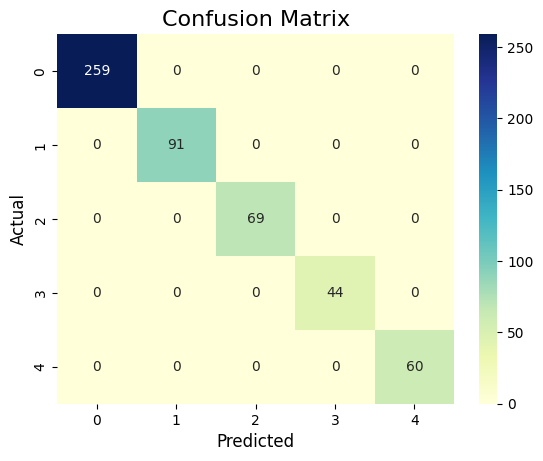

In [ ]:
cm = confusion_matrix(y_valid_1d, grid_pred)

sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'YlGnBu')
plt.xlabel('Predicted', fontsize = 12)
plt.ylabel('Actual', fontsize = 12)
plt.title('Confusion Matrix', fontsize = 16)
plt.show()

## Check Data

### Check Training dan Validasi Beda Sampel

In [ ]:
df_tr = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/training_info.tsv", sep = "\t")
df_tr.head()

,patient_ID,class,batch
0,GSM7461809,non-leukemia,29
1,MP2PRT_ALL_482,ALL,38
2,GSE277354_67,CML,33
3,MP2PRT_ALL_1066,ALL,38
4,MP2PRT_ALL_613,ALL,38


In [ ]:
train_class = df_tr["patient_ID"].to_list()
print(train_class)
print(len(train_class))

['GSM7461809', 'MP2PRT_ALL_482', 'GSE277354_67', 'MP2PRT_ALL_1066', 'MP2PRT_ALL_613', 'GSM3028297', 'GSE277354_65', 'MP2PRT_ALL_1005', 'TCGA_LAML_61', 'MP2PRT_ALL_1131', 'GSM8013438', 'MP2PRT_ALL_654', 'GSM3039815', 'GSM1614689', 'GSM1256814', 'MP2PRT_ALL_846', 'GSM4280587', 'MP2PRT_ALL_614', 'MP2PRT_ALL_709', 'MP2PRT_ALL_1240', 'TCGA_LAML_25', 'GSM8013451', 'GSM8013499', 'MP2PRT_ALL_227', 'GSM8013516', 'TARGET_AML_7', 'GSE277354_45', 'GSM8013506', 'MP2PRT_ALL_976', 'MP2PRT_ALL_238', 'MP2PRT_ALL_225', 'GSM4213256', 'GSE277354_41', 'MP2PRT_ALL_309', 'MP2PRT_ALL_1064', 'TCGA_LAML_49', 'MP2PRT_ALL_148', 'GSM8013545', 'MP2PRT_ALL_548', 'MP2PRT_ALL_537', 'MP2PRT_ALL_664', '2596-Bcell', 'MP2PRT_ALL_737', 'MP2PRT_ALL_228', 'GSM2433745', 'MP2PRT_ALL_1107', 'MP2PRT_ALL_889', 'MP2PRT_ALL_692', 'TCGA_LAML_101', 'MP2PRT_ALL_306', '5852-CMP', 'MP2PRT_ALL_111', 'GSM8013452', 'MP2PRT_ALL_76', 'GSM4280585', 'MP2PRT_ALL_466', 'MP2PRT_ALL_1199', 'GSM4280597', 'MP2PRT_ALL_167', 'GSM4005275', 'MP2PRT_ALL_

In [ ]:
df_val = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/validation_info.tsv", sep = "\t")
df_val.head()

,patient_ID,class,batch
0,GSM1614669,CLL,2
1,MP2PRT_ALL_1024,ALL,38
2,MP2PRT_ALL_1241,ALL,38
3,MP2PRT_ALL_337,ALL,38
4,MP2PRT_ALL_161,ALL,38


In [ ]:
val_class = df_val['patient_ID'].to_list()
print(val_class)
print(len(val_class))

['GSM1614669', 'MP2PRT_ALL_1024', 'MP2PRT_ALL_1241', 'MP2PRT_ALL_337', 'MP2PRT_ALL_161', 'MP2PRT_ALL_118', 'GSM1256824', 'TCGA_LAML_86', 'GSM7968123', 'MP2PRT_ALL_1011', 'TCGA_LAML_115', 'MP2PRT_ALL_726', 'MP2PRT_ALL_980', 'MP2PRT_ALL_935', 'MP2PRT_ALL_426', 'GSM7405309', 'AML14', 'MP2PRT_ALL_1291', 'MP2PRT_ALL_1205', 'MP2PRT_ALL_729', 'GSM7405318', 'MP2PRT_ALL_812', 'MP2PRT_ALL_1148', 'MP2PRT_ALL_830', 'MP2PRT_ALL_1149', 'MP2PRT_ALL_135', 'MP2PRT_ALL_461', 'NBM11_CD34', 'AML34', 'GSM8013515', 'GSM4567507', 'TCGA_LAML_119', 'MP2PRT_ALL_236', 'GSM7221873', 'GSM4567499', 'MP2PRT_ALL_577', 'MP2PRT_ALL_646', 'MP2PRT_ALL_1189', 'AML10', 'AML39', 'MP2PRT_ALL_870', 'TCGA_LAML_68', '5852-HSC', 'MP2PRT_ALL_1085', 'MP2PRT_ALL_947', 'TCGA_LAML_22', 'MP2PRT_ALL_942', 'GSM6340868', 'GSM4403518', 'GSM4983949', 'GSM8013539', 'GSM2473311', 'MP2PRT_ALL_160', 'GSM4433483', 'GSM1554630', 'GSM6615722', 'GSM4280571', 'MP2PRT_ALL_1160', 'GSM4280567', 'TCGA_LAML_94', 'GSM6615702', 'MP2PRT_ALL_72', 'MP2PRT_AL

In [ ]:
check = 0
for item in val_class:
  if train_class.count(item) > 0:
    print(item + " is on train data")
    check += 1
if check == 0:
  print("No Validation Sample in Training Data")

No Validation Sample in Training Data


### Cek PCA Plot Data Raw

#### Load Data

In [ ]:
df_raw = pd.read_csv("/content/drive/MyDrive/Tugas Akhir/preprocessing_data/integrated_non-batch_no-label.tsv", sep = "\t")
df_raw.head()

,Unnamed: 0,patient_ID,GSM1256809,GSM1256810,GSM1256811,GSM1256812,GSM1256813,GSM1256814,GSM1256815,GSM1256816,...,MP2PRT_ALL_1296,MP2PRT_ALL_1297,MP2PRT_ALL_1298,MP2PRT_ALL_1299,MP2PRT_ALL_1300,MP2PRT_ALL_1301,MP2PRT_ALL_1302,MP2PRT_ALL_1303,MP2PRT_ALL_1304,MP2PRT_ALL_1305
0,0,5S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,5_8S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,7SK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,A1BG,90.0,48.0,142.0,94.0,459.0,350.0,342.0,258.0,...,135.0,15.0,238.0,219.0,46.0,112.0,69.0,592.0,65.0,56.0
4,4,A1BG-AS1,81.0,39.0,94.0,126.0,346.0,278.0,308.0,188.0,...,155.0,175.0,421.0,434.0,101.0,296.0,121.0,365.0,127.0,203.0


In [ ]:
df_raw = df_raw.drop("Unnamed: 0", axis = 1)
df_raw.head()

,patient_ID,GSM1256809,GSM1256810,GSM1256811,GSM1256812,GSM1256813,GSM1256814,GSM1256815,GSM1256816,GSM1256817,...,MP2PRT_ALL_1296,MP2PRT_ALL_1297,MP2PRT_ALL_1298,MP2PRT_ALL_1299,MP2PRT_ALL_1300,MP2PRT_ALL_1301,MP2PRT_ALL_1302,MP2PRT_ALL_1303,MP2PRT_ALL_1304,MP2PRT_ALL_1305
0,5S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5_8S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7SK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,A1BG,90.0,48.0,142.0,94.0,459.0,350.0,342.0,258.0,3.0,...,135.0,15.0,238.0,219.0,46.0,112.0,69.0,592.0,65.0,56.0
4,A1BG-AS1,81.0,39.0,94.0,126.0,346.0,278.0,308.0,188.0,6.0,...,155.0,175.0,421.0,434.0,101.0,296.0,121.0,365.0,127.0,203.0


In [ ]:
df_raw.set_index('patient_ID', inplace = True)
df_raw.head()

,GSM1256809,GSM1256810,GSM1256811,GSM1256812,GSM1256813,GSM1256814,GSM1256815,GSM1256816,GSM1256817,GSM1256818,...,MP2PRT_ALL_1296,MP2PRT_ALL_1297,MP2PRT_ALL_1298,MP2PRT_ALL_1299,MP2PRT_ALL_1300,MP2PRT_ALL_1301,MP2PRT_ALL_1302,MP2PRT_ALL_1303,MP2PRT_ALL_1304,MP2PRT_ALL_1305
patient_ID,,,,,,,,,,,,,,,,,,,,,
5S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5_8S_rRNA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7SK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1BG,90.0,48.0,142.0,94.0,459.0,350.0,342.0,258.0,3.0,4.0,...,135.0,15.0,238.0,219.0,46.0,112.0,69.0,592.0,65.0,56.0
A1BG-AS1,81.0,39.0,94.0,126.0,346.0,278.0,308.0,188.0,6.0,3.0,...,155.0,175.0,421.0,434.0,101.0,296.0,121.0,365.0,127.0,203.0


In [ ]:
label_raw = pd.read_csv("")

In [ ]:
sc = StandardScaler()

In [ ]:
sc.fit(x)

In [ ]:
pca = PCA(n_components = 2)

## Cek Korelasi

In [ ]:
features_corr = x_train.corr(method = 'pearson')

In [ ]:
features_corr

Unnamed: 0,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,TREML4,...,FLJ45513,LOC400682,PGLYRP1,LOC112268195,LINC01122,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
TBC1D27P,1.000000,0.209057,0.339093,0.511165,0.822491,0.902616,0.616304,0.889746,0.697911,0.558100,...,0.450934,0.742980,0.782996,0.294289,0.805885,0.517237,0.860649,0.801313,0.541688,0.651261
SERPINB9-AS1,0.209057,1.000000,0.716853,0.216939,0.318802,0.319430,0.653121,0.151725,-0.183711,0.645433,...,0.734559,0.243409,0.396348,0.841614,0.271783,0.266738,0.249996,0.383382,0.314553,0.625193
MIR4313,0.339093,0.716853,1.000000,0.632292,0.247299,0.327746,0.790068,0.162022,-0.206613,0.818281,...,0.904572,0.114667,0.339856,0.877431,0.202883,-0.061883,0.354043,0.603389,0.689595,0.782175
LOC105374407,0.511165,0.216939,0.632292,1.000000,0.116879,0.379172,0.686152,0.281123,0.074156,0.605267,...,0.726499,-0.055752,0.155596,0.483658,0.097511,-0.219097,0.384025,0.711884,0.764094,0.632370
WNT6,0.822491,0.318802,0.247299,0.116879,1.000000,0.827926,0.483036,0.848172,0.614181,0.532546,...,0.309802,0.923462,0.914690,0.294847,0.925962,0.680662,0.846031,0.586233,0.358452,0.596006
LAG3,0.902616,0.319430,0.327746,0.379172,0.827926,1.000000,0.608788,0.847091,0.666143,0.505579,...,0.435638,0.755904,0.797591,0.333257,0.811328,0.622424,0.781527,0.731373,0.421446,0.590342
SLC25A27,0.616304,0.653121,0.790068,0.686152,0.483036,0.608788,1.000000,0.447875,0.095504,0.830130,...,0.877632,0.338862,0.539416,0.795914,0.475682,0.196287,0.586428,0.782746,0.715777,0.839938
TRERNA1,0.889746,0.151725,0.162022,0.281123,0.848172,0.847091,0.447875,1.000000,0.795034,0.390304,...,0.261339,0.810846,0.776720,0.151059,0.847927,0.658218,0.803724,0.667806,0.315216,0.510641
S100A16,0.697911,-0.183711,-0.206613,0.074156,0.614181,0.666143,0.095504,0.795034,1.000000,-0.021770,...,-0.117964,0.635136,0.516526,-0.244140,0.634760,0.568282,0.555225,0.412587,0.020025,0.112703


In [ ]:
selected_features = features_corr.iloc[30:40, 40:50]
selected_features

Unnamed: 0,FLJ45513,LOC400682,PGLYRP1,LOC112268195,LINC01122,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2
Unnamed: 0,,,,,,,,,,
BEST3,0.051552,0.813641,0.754950,0.148936,0.772647,0.735470,0.602931,0.249201,0.040247,0.312005
CNTNAP2,0.438247,0.739891,0.785186,0.314545,0.816549,0.557542,0.812707,0.753060,0.486130,0.622309
PCDHGB8P,-0.322617,0.698686,0.522313,-0.365642,0.671433,0.664034,0.491240,0.202143,-0.177520,-0.033573
LINC01978,-0.209884,0.734368,0.592883,-0.186997,0.686797,0.615442,0.530036,0.197024,-0.064783,0.106867
SSSCA1,-0.108854,0.136282,0.070969,-0.190510,0.125872,0.525160,-0.019633,0.143101,-0.366965,-0.198762
CGNL1,0.649138,0.754752,0.830811,0.575663,0.818302,0.506568,0.862110,0.797581,0.618150,0.818870
SNHG25,0.200971,0.743433,0.711976,0.043449,0.782707,0.494258,0.814310,0.661926,0.412842,0.488010
HLA-DPB2,0.785499,0.490990,0.652809,0.699907,0.602019,0.221148,0.741626,0.761934,0.773417,0.890402
PLA2G2D,0.855037,0.401687,0.593726,0.778485,0.508938,0.134179,0.634181,0.766638,0.778977,0.867294


In [ ]:
#features_corr.to_csv('/content/drive/MyDrive/Tugas Akhir/Features_selection_revisi/random_forest_50/features_correlation.tsv', sep = "\t")

In [ ]:
plt.figure(figsize = (35, 28), dpi = 500)
sns.heatmap(features_corr, annot = True)
plt.show()

### Korelasi Fitur ke Label

In [ ]:
samples = list(x_train.index)
print(samples)

['GSM7461809', 'MP2PRT_ALL_482', 'GSE277354_67', 'MP2PRT_ALL_1066', 'MP2PRT_ALL_613', 'GSM3028297', 'GSE277354_65', 'MP2PRT_ALL_1005', 'TCGA_LAML_61', 'MP2PRT_ALL_1131', 'GSM8013438', 'MP2PRT_ALL_654', 'GSM3039815', 'GSM1614689', 'GSM1256814', 'MP2PRT_ALL_846', 'GSM4280587', 'MP2PRT_ALL_614', 'MP2PRT_ALL_709', 'MP2PRT_ALL_1240', 'TCGA_LAML_25', 'GSM8013451', 'GSM8013499', 'MP2PRT_ALL_227', 'GSM8013516', 'TARGET_AML_7', 'GSE277354_45', 'GSM8013506', 'MP2PRT_ALL_976', 'MP2PRT_ALL_238', 'MP2PRT_ALL_225', 'GSM4213256', 'GSE277354_41', 'MP2PRT_ALL_309', 'MP2PRT_ALL_1064', 'TCGA_LAML_49', 'MP2PRT_ALL_148', 'GSM8013545', 'MP2PRT_ALL_548', 'MP2PRT_ALL_537', 'MP2PRT_ALL_664', '2596-Bcell', 'MP2PRT_ALL_737', 'MP2PRT_ALL_228', 'GSM2433745', 'MP2PRT_ALL_1107', 'MP2PRT_ALL_889', 'MP2PRT_ALL_692', 'TCGA_LAML_101', 'MP2PRT_ALL_306', '5852-CMP', 'MP2PRT_ALL_111', 'GSM8013452', 'MP2PRT_ALL_76', 'GSM4280585', 'MP2PRT_ALL_466', 'MP2PRT_ALL_1199', 'GSM4280597', 'MP2PRT_ALL_167', 'GSM4005275', 'MP2PRT_ALL_

In [ ]:
len(samples)

1852

In [ ]:
y_df = pd.DataFrame(encoded_y_train, index = samples, columns = ['ALL', 'AML', 'CLL', 'CML', 'non-leukemia'])
y_df.head()

,ALL,AML,CLL,CML,non-leukemia
GSM7461809,0,0,0,0,1
MP2PRT_ALL_482,1,0,0,0,0
GSE277354_67,0,0,0,1,0
MP2PRT_ALL_1066,1,0,0,0,0
MP2PRT_ALL_613,1,0,0,0,0


In [ ]:
x_train = x_train.reset_index()
x_train.rename(columns = {'Unnamed: 0': 'patient_ID', 'index' : 'patient_ID'}, inplace = True)
x_train.head()

Unnamed: 0,patient_ID,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,...,FLJ45513,LOC400682,PGLYRP1,LOC112268195,LINC01122,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2
0,GSM7461809,-10.806466,-497.343639,-101.186298,-24.254444,-142.764776,-78.363126,-268.485713,-70.477622,23.975519,...,-451.790579,-6.792481,-119.710626,-445.893716,28.733891,-110.926651,-115.665049,-44.666227,174.19289,-401.027055
1,MP2PRT_ALL_482,366.079262,120.999312,27.794513,168.266317,143.213574,188.231141,33.302496,220.42019,104.655923,...,222.585532,93.850294,85.536495,116.773294,18.490831,10.499644,107.519068,139.712275,186.085695,313.411792
2,GSE277354_67,85.820615,-11.427155,-43.630624,43.621096,-247.334368,51.208553,12.130978,45.644341,120.708134,...,-310.652355,-48.453292,-132.554433,-178.05957,-97.218027,133.504739,-207.012207,21.807789,-597.161225,-282.866103
3,MP2PRT_ALL_1066,365.612249,120.999312,27.794513,168.266317,231.562719,164.233625,82.39611,79.862099,-38.799076,...,222.585532,93.850294,182.054819,116.773294,70.74694,21.376525,197.9651,70.117513,144.629903,219.360186
4,MP2PRT_ALL_613,326.421886,120.999312,27.794513,168.266317,143.213574,315.215268,318.593652,10.704457,71.622872,...,222.585532,93.850294,85.536495,116.773294,393.930643,38.197197,134.438776,14.973804,84.268589,256.624831


In [ ]:
y_df = y_df.reset_index()
y_df.rename(columns = {'Unnamed: 0': 'idx', 'index':'patient_ID'}, inplace = True)
y_df.head()

,patient_ID,ALL,AML,CLL,CML,non-leukemia
0,GSM7461809,0,0,0,0,1
1,MP2PRT_ALL_482,1,0,0,0,0
2,GSE277354_67,0,0,0,1,0
3,MP2PRT_ALL_1066,1,0,0,0,0
4,MP2PRT_ALL_613,1,0,0,0,0


In [ ]:
df_all = pd.merge(x_train, y_df, how = 'left', on = 'patient_ID')
df_all.head()

,patient_ID,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,...,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2,ALL,AML,CLL,CML,non-leukemia
0,GSM7461809,-10.806466,-497.343639,-101.186298,-24.254444,-142.764776,-78.363126,-268.485713,-70.477622,23.975519,...,-110.926651,-115.665049,-44.666227,174.19289,-401.027055,0,0,0,0,1
1,MP2PRT_ALL_482,366.079262,120.999312,27.794513,168.266317,143.213574,188.231141,33.302496,220.42019,104.655923,...,10.499644,107.519068,139.712275,186.085695,313.411792,1,0,0,0,0
2,GSE277354_67,85.820615,-11.427155,-43.630624,43.621096,-247.334368,51.208553,12.130978,45.644341,120.708134,...,133.504739,-207.012207,21.807789,-597.161225,-282.866103,0,0,0,1,0
3,MP2PRT_ALL_1066,365.612249,120.999312,27.794513,168.266317,231.562719,164.233625,82.39611,79.862099,-38.799076,...,21.376525,197.9651,70.117513,144.629903,219.360186,1,0,0,0,0
4,MP2PRT_ALL_613,326.421886,120.999312,27.794513,168.266317,143.213574,315.215268,318.593652,10.704457,71.622872,...,38.197197,134.438776,14.973804,84.268589,256.624831,1,0,0,0,0


In [ ]:
df_all.set_index('patient_ID', inplace = True)
df_all.head()

,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,TREML4,...,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2,ALL,AML,CLL,CML,non-leukemia
patient_ID,,,,,,,,,,,,,,,,,,,,,
GSM7461809,-10.806466,-497.343639,-101.186298,-24.254444,-142.764776,-78.363126,-268.485713,-70.477622,23.975519,-256.006398,...,-110.926651,-115.665049,-44.666227,174.19289,-401.027055,0,0,0,0,1
MP2PRT_ALL_482,366.079262,120.999312,27.794513,168.266317,143.213574,188.231141,33.302496,220.42019,104.655923,174.446809,...,10.499644,107.519068,139.712275,186.085695,313.411792,1,0,0,0,0
GSE277354_67,85.820615,-11.427155,-43.630624,43.621096,-247.334368,51.208553,12.130978,45.644341,120.708134,-550.98802,...,133.504739,-207.012207,21.807789,-597.161225,-282.866103,0,0,0,1,0
MP2PRT_ALL_1066,365.612249,120.999312,27.794513,168.266317,231.562719,164.233625,82.39611,79.862099,-38.799076,262.371475,...,21.376525,197.9651,70.117513,144.629903,219.360186,1,0,0,0,0
MP2PRT_ALL_613,326.421886,120.999312,27.794513,168.266317,143.213574,315.215268,318.593652,10.704457,71.622872,368.624212,...,38.197197,134.438776,14.973804,84.268589,256.624831,1,0,0,0,0


In [ ]:
df_corr = df_all.corr(method = 'pearson')

In [ ]:
df_corr

,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,TREML4,...,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2,ALL,AML,CLL,CML,non-leukemia
TBC1D27P,1.000000,0.209057,0.339093,0.511165,0.822491,0.902616,0.616304,0.889746,0.697911,0.558100,...,0.517237,0.860649,0.801313,0.541688,0.651261,0.863918,-0.731579,-0.370293,0.030425,-0.117294
SERPINB9-AS1,0.209057,1.000000,0.716853,0.216939,0.318802,0.319430,0.653121,0.151725,-0.183711,0.645433,...,0.266738,0.249996,0.383382,0.314553,0.625193,0.513717,0.197002,-0.061963,-0.149594,-0.843324
MIR4313,0.339093,0.716853,1.000000,0.632292,0.247299,0.327746,0.790068,0.162022,-0.206613,0.818281,...,-0.061883,0.354043,0.603389,0.689595,0.782175,0.648218,0.255312,-0.523951,-0.316516,-0.487020
LOC105374407,0.511165,0.216939,0.632292,1.000000,0.116879,0.379172,0.686152,0.281123,0.074156,0.605267,...,-0.219097,0.384025,0.711884,0.764094,0.632370,0.574146,0.077057,-0.923737,0.005063,-0.013025
WNT6,0.822491,0.318802,0.247299,0.116879,1.000000,0.827926,0.483036,0.848172,0.614181,0.532546,...,0.680662,0.846031,0.586233,0.358452,0.596006,0.806903,-0.762075,0.083202,-0.196037,-0.277574
LAG3,0.902616,0.319430,0.327746,0.379172,0.827926,1.000000,0.608788,0.847091,0.666143,0.505579,...,0.622424,0.781527,0.731373,0.421446,0.590342,0.802252,-0.689764,-0.234103,0.107805,-0.282376
SLC25A27,0.616304,0.653121,0.790068,0.686152,0.483036,0.608788,1.000000,0.447875,0.095504,0.830130,...,0.196287,0.586428,0.782746,0.715777,0.839938,0.808348,-0.046221,-0.562072,-0.133941,-0.497686
TRERNA1,0.889746,0.151725,0.162022,0.281123,0.848172,0.847091,0.447875,1.000000,0.795034,0.390304,...,0.658218,0.803724,0.667806,0.315216,0.510641,0.744924,-0.825651,-0.134494,0.088559,-0.120367
S100A16,0.697911,-0.183711,-0.206613,0.074156,0.614181,0.666143,0.095504,0.795034,1.000000,-0.021770,...,0.568282,0.555225,0.412587,0.020025,0.112703,0.391771,-0.858990,-0.006806,0.325635,0.131054
TREML4,0.558100,0.645433,0.818281,0.605267,0.532546,0.505579,0.830130,0.390304,-0.021770,1.000000,...,0.053000,0.654759,0.702930,0.828854,0.919530,0.865641,-0.019113,-0.435032,-0.510208,-0.428214


In [ ]:
features_label = df_corr.iloc[50:55, 0:50]
features_label

,TBC1D27P,SERPINB9-AS1,MIR4313,LOC105374407,WNT6,LAG3,SLC25A27,TRERNA1,S100A16,TREML4,...,FLJ45513,LOC400682,PGLYRP1,LOC112268195,LINC01122,ANO1,TTTY10,CYP21A2,CHST13,SNORD3B-2
ALL,0.863918,0.513717,0.648218,0.574146,0.806903,0.802252,0.808348,0.744924,0.391771,0.865641,...,0.735339,0.711816,0.822917,0.649442,0.783793,0.377631,0.886734,0.834534,0.746880,0.905314
AML,-0.731579,0.197002,0.255312,0.077057,-0.762075,-0.689764,-0.046221,-0.825651,-0.858990,-0.019113,...,0.201409,-0.808611,-0.662923,0.271767,-0.781320,-0.678252,-0.665032,-0.338849,-0.006358,-0.137185
CLL,-0.370293,-0.061963,-0.523951,-0.923737,0.083202,-0.234103,-0.562072,-0.134494,-0.006806,-0.435032,...,-0.611070,0.235539,0.053508,-0.352954,0.085810,0.347460,-0.205967,-0.590200,-0.661439,-0.465234
CML,0.030425,-0.149594,-0.316516,0.005063,-0.196037,0.107805,-0.133941,0.088559,0.325635,-0.510208,...,-0.199534,-0.195871,-0.259995,-0.307738,-0.190237,0.294444,-0.278305,-0.025840,-0.447060,-0.381386
non-leukemia,-0.117294,-0.843324,-0.487020,-0.013025,-0.277574,-0.282376,-0.497686,-0.120367,0.131054,-0.428214,...,-0.568380,-0.235479,-0.333351,-0.698011,-0.226305,-0.411287,-0.138932,-0.255010,-0.071213,-0.429815


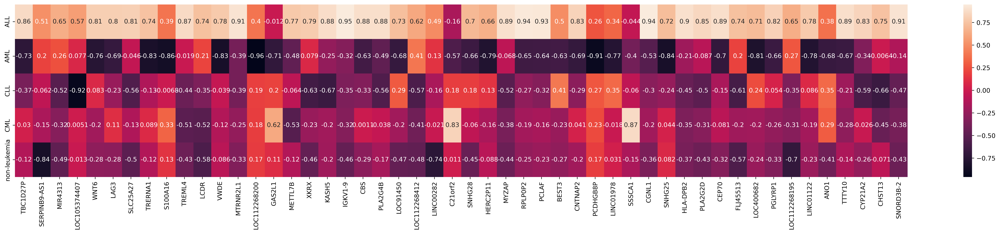

In [ ]:
plt.figure(figsize = (32, 5), dpi = 500)
sns.heatmap(features_label, annot = True)
plt.show()